# Assignment #4

READ ALL INSTRUCTIONS CAREFULLY

This assignment is a puzzle. You have been given a data set with some semi-informative column headers but no additional information about it. Your goal is to investigate the data, understand as much about it as you can, and report back what you find.

You are free to use any and all of the techniques we have covered this semester: EDA, data wrangling, visualization (scatter plots, line plots, histograms, jointplots, etc.), descriptive statistics (mean, median, variance, covariance, etc.), regression / model fitting, loss functions (MSE, MAE), R^2, cross-validation, bootstrapping, gradient descent, etc... 

There are many different ways to approach this assignment and be successful. I recommend starting simple and getting slowly more sophisticated as needed.

## Collaborators

You must work in groups of 2-3. You cannot work on this assignment alone. Your partners cannot be anyone you have partnered with previously on an assignment and they cannot be in your group for the semester project.

**Names of all collaborators go here** (including yourself):
Akil Parrish, 
Duncan Hugelmaier
Robin Hurtado

## Tools

You are not allowed to use LLMs (including the LLM results that pop up in Google search). You may use search online for ideas, use StackExchange, and I highly encourage using Python library documentation.

Hint: It may be useful to use the sklearn library for model fitting (and not to implement model fitting or optimization by hand).

## Submission Instructions

You must submit two files. One is your **Jupyter notebook** that you use to explore and analyze the data. The second file is a separate **PDF** reporting, presenting, and explaining your results with no code in it.

**Only one person** in your group should submit the assignment files on Canvas. Be sure everyone's names are listed under collaborators in both the notebook and the PDF so everyone gets credit!

## Potentially Helpful Documentation


https://scikit-learn.org/stable/api/sklearn.model_selection.html

https://scikit-learn.org/stable/modules/linear_model.html

https://scikit-learn.org/stable/api/sklearn.metrics.html

https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html

# Your Code Below

## Imports and CoW

In [2]:
# Add all of your import statements here. ONLY include the imports you actually use. There are useful tools in the scikit-learn library for regression and model fitting, but you are not required to use it. If you use it, you will need to install it into your virtual environment.
from pathlib import Path
import pandas as pd
# import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# from sklearn.<something> import <something>
import plotly

In [3]:
# Enforce Copy-on-Write (CoW) semantics here
pd.options.mode.copy_on_write = True

## Project Folder Organization and File Reading

You must read in the given data file using relative paths, as shown in previous assignments. Organize your work to be in a project folder, with src and data subfolders. Place your solution notebook in the src folder, and the given data file in the data folder.

In [4]:
# Read in the data file (using relative paths for reproducibility). It should be able to download your notebook, put it in the src folder of my project folder, and run it without changing anything.
# set standard paths
cwd = Path().cwd() #set our cwd
project_folder = cwd.parent #set our project folder as the cwd parent

In [ ]:
# construct the path to and retrieve the file that holds the info regarding the buinesses
path = Path('data/mystery-1.csv') # using a data folder makes life easier
mystery_file = project_folder / path # join the project folder with the dataset path
if not mystery_file.exists():  # error catching in case the file is not found
	raise FileNotFoundError(f"Dataset file not found: {mystery_file}")

df_mystery = pd.read_csv(mystery_file)

# Explore data

In [6]:
df_mystery.head()

,x|y|z|d1|d2|d3|d4|c
0,45.25704327|109.76417917|38.05759603823384|-59...
1,45.14670334|109.81468014|40.92275497629194|-57...
2,47.73228811|109.73347168|39.181963976259205|-4...
3,46.39393552|109.37686729|37.073852642673714|-5...
4,52.9087|109.6072|37.583850691646205|-12.337559...


In [7]:
df_mystery.columns

Index(['x|y|z|d1|d2|d3|d4|c'], dtype='object')

In [8]:
df_mystery.info

<bound method DataFrame.info of                                     x|y|z|d1|d2|d3|d4|c
0     45.25704327|109.76417917|38.05759603823384|-59...
1     45.14670334|109.81468014|40.92275497629194|-57...
2     47.73228811|109.73347168|39.181963976259205|-4...
3     46.39393552|109.37686729|37.073852642673714|-5...
4     52.9087|109.6072|37.583850691646205|-12.337559...
...                                                 ...
1849  69.12727174999999|15.469880873|44.189617511396...
1850  79.06287943|19.10065579|40.525671245974074|457...
1851  67.09992541|10.135119325|37.65319272597221|412...
1852  76.6846168|16.157544846|36.88472364432388|449....
1853  77.07055797999999|11.330551663|40.954199935287...

[1854 rows x 1 columns]>

In [9]:
df_mystery.columns

Index(['x|y|z|d1|d2|d3|d4|c'], dtype='object')

Data appears to be seperated by pipes, an index with pipes, dtype object, 1854 rows and 1 column.

In [10]:
df_mystery.describe()

,x|y|z|d1|d2|d3|d4|c
count,1854
unique,1854
top,45.25704327|109.76417917|38.05759603823384|-59...
freq,1


1854 "unique" rows.  That didnt tell us much.  Treating the pipe as a delimiter and splitting.

Do we need to handle na values?

In [72]:
df_mystery.isna().value_counts()

x|y|z|d1|d2|d3|d4|c
False                  1854
Name: count, dtype: int64

Does not appear to be any na values. splitting at the pipes.

In [12]:
df_mystery_sep = pd.read_csv(mystery_file, delimiter= '|')

## Explore separated dataframe

Peek at the now seperated data:

In [92]:
# display first 5 values in seperated dataframe
df_mystery_sep.head()

,x,y,z,d1,d2,d3,d4,c
0,45.257043,109.764179,38.057596,-59.072649,-14.805744,37.863842,94095.637152,11.0
1,45.146703,109.814680,40.922755,-57.052267,-15.018721,37.872534,93969.141494,3.0
2,47.732288,109.733472,39.181964,-42.744882,-9.708060,37.671144,93724.024307,11.0
3,46.393936,109.376867,37.073853,-51.804489,-12.540430,37.774738,93377.854892,10.0
4,52.908700,109.607200,37.583851,-12.337559,2.932994,37.291647,93101.403795,0.0


In [93]:
# display last 5 values in seperated dataframe
df_mystery_sep.iloc[1849: 1854, :]

,x,y,z,d1,d2,d3,d4,c
1849,69.127272,15.469881,44.189618,413.268380,59.889351,36.593340,-4790.832560,12.0
1850,79.062879,19.100656,40.525671,457.867006,107.774087,36.857181,-4936.105016,4.0
1851,67.099925,10.135119,37.653193,412.503332,51.331193,36.618824,-5086.125698,1.0
1852,76.684617,16.157545,36.884724,449.725234,95.413365,36.727196,-5124.376623,1.0
1853,77.070558,11.330552,40.954200,472.560728,97.380800,36.745135,-6575.228052,1.0


From the head() thought maybe x's were in order.  last 5 rows shows they are not.

In [94]:
df_mystery_sep.describe()

,x,y,z,d1,d2,d3,d4,c
count,1854.000000,1854.000000,1854.000000,1854.000000,1854.000000,1854.000000,1854.000000,1854.000000
mean,44.702607,53.394344,35.514137,138.298107,3.278987,33.312987,28604.297833,6.002157
std,70.720754,74.296663,68.185888,159.671681,79.173899,67.983135,26765.170592,3.737760
min,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-6575.228052,0.000000
25%,35.862902,32.303485,37.941742,24.969669,-28.312801,36.854105,4106.422132,3.000000
50%,47.474927,57.428922,39.920321,142.894013,-10.266625,37.698475,21852.839683,6.000000
75%,62.189990,81.894692,42.012014,252.666808,32.307670,38.592883,50220.331945,9.000000
max,93.248123,109.814680,48.870364,474.250238,193.247985,39.963298,94095.637152,12.000000


It appears we have 8 columns and 1854 rows of data.

Any  nulls or nas  now? 

In [95]:
df_mystery_sep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1854 entries, 0 to 1853
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       1854 non-null   float64
 1   y       1854 non-null   float64
 2   z       1854 non-null   float64
 3   d1      1854 non-null   float64
 4   d2      1854 non-null   float64
 5   d3      1854 non-null   float64
 6   d4      1854 non-null   float64
 7   c       1854 non-null   float64
dtypes: float64(8)
memory usage: 116.0 KB


In [96]:
# print na and null value counts
print( 'na vals: ', df_mystery_sep.isna().value_counts(), '\n\nnull vals: ',df_mystery_sep.isnull().value_counts())

na vals:  x      y      z      d1     d2     d3     d4     c    
False  False  False  False  False  False  False  False    1854
Name: count, dtype: int64 

null vals:  x      y      z      d1     d2     d3     d4     c    
False  False  False  False  False  False  False  False    1854
Name: count, dtype: int64


no null, no na

Column 'c' appears to have some repeating values. What are the unique values?

In [97]:
df_mystery_sep['c'].unique()

array([11.,  3., 10.,  0., 12.,  4.,  1.,  7.,  5.,  2.,  9.,  6.,  8.])


Sorting values in c to check in any are missing:

In [98]:
cs = df_mystery_sep['c'].unique()
cs.sort(axis=0)
cs


array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.])

Column c has integer values that range for 0 to 12. May be categorical

What do the values in the other columns look like?

In [99]:
# create array of all column names
cols = ['x', 'y', 'z', 'd1', 'd2', 'd3', 'd4', 'c']
# display value counts for values in each column
for col in cols:
    print(df_mystery_sep[col].value_counts())

x
-999.000000    8
 51.626700     4
 44.960000     4
 24.703600     4
 39.062600     3
              ..
 73.165100     1
 52.426051     1
 73.964327     1
 70.437222     1
 45.242406     1
Name: count, Length: 1805, dtype: int64
y
-999.000000    8
 20.761000     6
 61.530300     3
 61.145600     3
 65.376400     3
              ..
 11.624418     1
 20.748198     1
 20.638568     1
 17.713466     1
 20.615874     1
Name: count, Length: 1808, dtype: int64
z
-999.000000    8
 36.559350     1
 42.605554     1
 44.211274     1
 42.147507     1
              ..
 40.531790     1
 36.395774     1
 42.933681     1
 41.493579     1
 37.288487     1
Name: count, Length: 1847, dtype: int64
d1
-999.000000    8
 439.087301    1
-51.040003     1
 409.412039    1
 414.797934    1
              ..
 320.807677    1
 417.034295    1
 402.429604    1
 377.944245    1
-55.697312     1
Name: count, Length: 1847, dtype: int64
d2
-999.000000    8
-0.447345      4
-15.376320     4
-33.468931     4
-24.877798  

The other columns appear to have more than just 13 unique values each. 

-999 seems to be an outlier.  Thinking it may be a placeholder value. Cols x through d4 have 8 rows that are -999.  Check out later if they are the same rows.

How many of each value does c have?

In [100]:
df_mystery_sep['c'].value_counts().sort_index()

c
0.0     142
1.0     142
2.0     142
3.0     143
4.0     143
5.0     143
6.0     143
7.0     143
8.0     143
9.0     143
10.0    143
11.0    142
12.0    142
Name: count, dtype: int64

Fairly even number of values in c, ranging 0-12, with middle values (3-10) each having 1 more. 

Try some visualization to see if any patterns emerge:

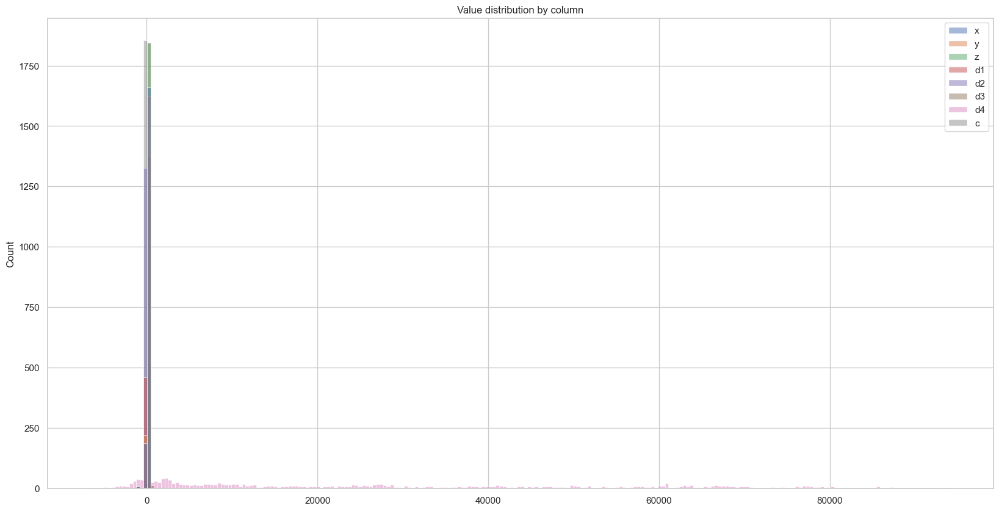

In [101]:
plt.figure(figsize=(20,10))
sns.histplot(data=df_mystery_sep).set(title= "Value distribution by column")
plt.show()

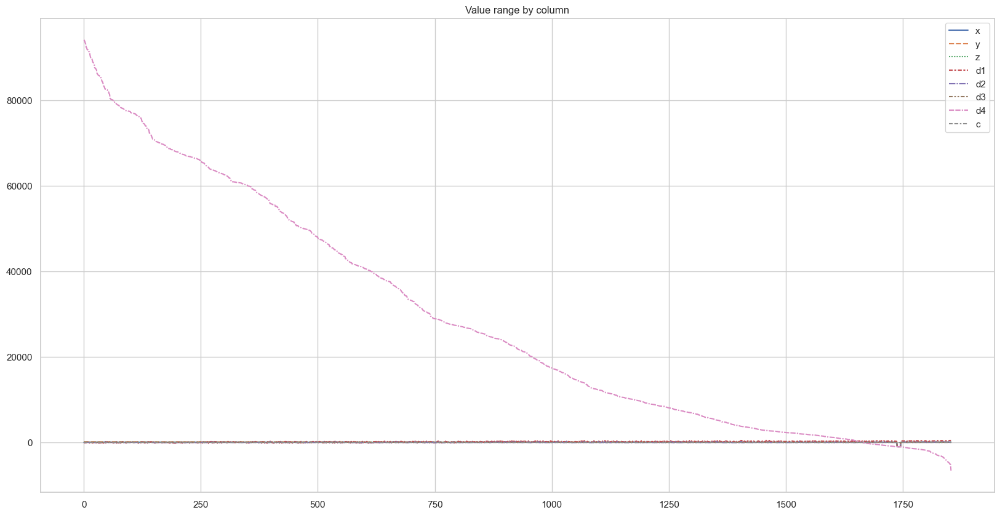

In [102]:
plt.figure(figsize=(20,10))
sns.lineplot(data=df_mystery_sep).set(title = "Value range by column")
plt.show()

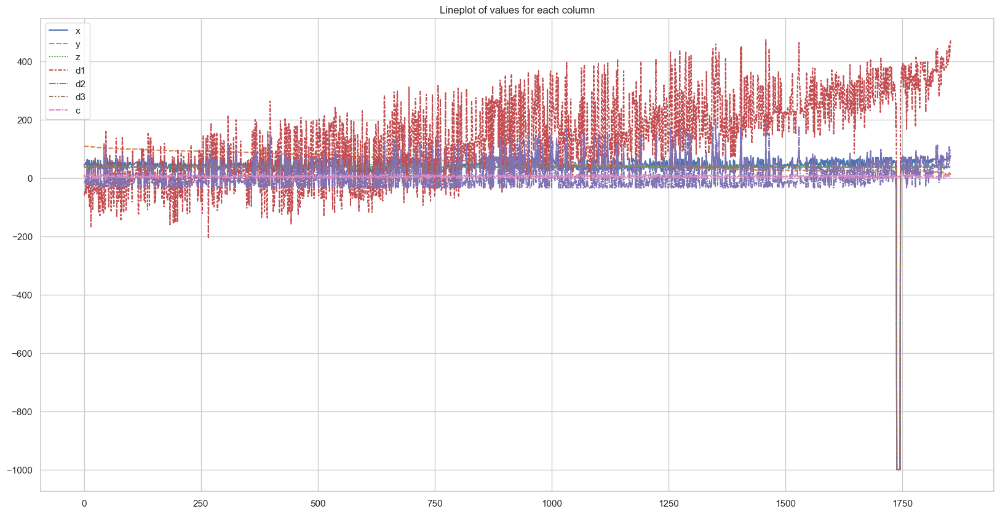

In [103]:
plt.figure(figsize=(20,10))
sns.lineplot(data=df_mystery_sep[['x', 'y', 'z', 'd1', 'd2', 'd3', 'c']]).set(title = "Lineplot of values for each column")
plt.show()

Hard to graph with the -999s for x.  
Maybe the same data is missing from x, y, and z? 
Which x values have -999, and what does the other data look like/ what might it mean?

In [104]:
# retrieve indexes for -999 values in x
index999s = df_mystery_sep[df_mystery_sep['x'] == -999].index
# retrieve all columns for those indexes
df_mystery_sep.iloc[index999s]

,x,y,z,d1,d2,d3,d4,c
1738,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,8.0
1739,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,7.0
1740,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,6.0
1741,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,9.0
1742,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,5.0
1743,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,4.0
1744,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,3.0
1745,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,10.0


In [105]:
# value counts for all columns when x is -999
df_mystery_sep.iloc[index999s].value_counts()

x       y       z       d1      d2      d3      d4      c   
-999.0  -999.0  -999.0  -999.0  -999.0  -999.0  -999.0  3.0     1
                                                        4.0     1
                                                        5.0     1
                                                        6.0     1
                                                        7.0     1
                                                        8.0     1
                                                        9.0     1
                                                        10.0    1
Name: count, dtype: int64

When x is -999, y, z, d1, d3, d3, and d4 are ALSO -999, but c has a value?  confusing.

Do the other columns have -999 when x is NOT -999?

In [106]:
# store indexes for rows where y = -999
indexy999s = df_mystery_sep[df_mystery_sep['y'] == -999].index
# retrieve all columns for those rows
df_mystery_sep.iloc[indexy999s]


,x,y,z,d1,d2,d3,d4,c
1738,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,8.0
1739,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,7.0
1740,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,6.0
1741,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,9.0
1742,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,5.0
1743,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,4.0
1744,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,3.0
1745,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,10.0


Y is -999 for the same rows that x is -999, and ONLY those rows.

Is that true for all of the columns?

In [107]:
indexy999s = df_mystery_sep[df_mystery_sep['y'] == -999].index
indexz999s = df_mystery_sep[df_mystery_sep['z'] == -999].index
indexd1999s = df_mystery_sep[df_mystery_sep['d1'] == -999].index
indexd2999s = df_mystery_sep[df_mystery_sep['d2'] == -999].index
indexd3999s = df_mystery_sep[df_mystery_sep['d3'] == -999].index
indexd4999s = df_mystery_sep[df_mystery_sep['d4'] == -999].index
print('x & y: ', index999s == indexy999s, '\nx & z: ', index999s == indexz999s, '\nx & d1: ', index999s == indexd1999s, 
      '\nx & d2: ', index999s  == indexd2999s, '\nx & d3: ', index999s == indexd3999s, '\nx & d4: ', index999s == indexd4999s )


x & y:  [ True  True  True  True  True  True  True  True] 
x & z:  [ True  True  True  True  True  True  True  True] 
x & d1:  [ True  True  True  True  True  True  True  True] 
x & d2:  [ True  True  True  True  True  True  True  True] 
x & d3:  [ True  True  True  True  True  True  True  True] 
x & d4:  [ True  True  True  True  True  True  True  True]


Rows in index have -999s in all columns except c, and those are the only rows that have -999s.  
Creating a new df without those rows for better visualization.  

May need to explore why they still have c values later, but this seems to indicate that the value in c is 
NOT dependent on x, y, z, d1, d2, d3, or d4.


In reality, because we dont know anything about this data, we can't know how significant or insignificant the -999s are.

In [108]:
# store all rows that DO NOT have -999 in new df_mystery)sep2
df_mystery_sep2 = df_mystery_sep[df_mystery_sep['x'] != -999]
# confirming there are no -999s remaining
df_mystery_sep2[df_mystery_sep2 == -999]. value_counts()

Series([], Name: count, dtype: int64)

What does the value distribution look like now?

In [109]:
df_mystery_sep2.describe()

,x,y,z,d1,d2,d3,d4,c
count,1846.000000,1846.000000,1846.000000,1846.000000,1846.000000,1846.000000,1846.000000,1846.000000
mean,49.225695,57.955099,39.997406,143.226810,7.622558,37.786716,28732.589481,6.000000
std,16.713001,26.847766,2.974248,141.325319,43.828991,0.964186,26751.900963,3.742671
min,10.520750,10.135119,30.190542,-203.894934,-33.540389,36.589368,-6575.228052,0.000000
25%,36.033403,32.681073,37.977585,27.098028,-28.148776,36.857343,4289.079588,3.000000
50%,47.551269,57.714450,39.945382,143.530673,-10.101627,37.703620,22295.512173,6.000000
75%,62.237845,81.930778,42.018724,253.332106,32.481449,38.596542,50345.835908,9.000000
max,93.248123,109.814680,48.870364,474.250238,193.247985,39.963298,94095.637152,12.000000


In [110]:
# difference between data distributions to see the affect of removing the -999 values
df_mystery_sep2.describe() - df_mystery_sep.describe()

,x,y,z,d1,d2,d3,d4,c
count,-8.000000,-8.000000,-8.000000,-8.000000,-8.000000,-8.000000,-8.000000,-8.000000
mean,4.523088,4.560756,4.483268,4.928703,4.343571,4.473729,128.291648,-0.002157
std,-54.007753,-47.448897,-65.211639,-18.346362,-35.344908,-67.018949,-13.269630,0.004911
min,1009.520750,1009.135119,1029.190542,795.105066,965.459611,1035.589368,0.000000,0.000000
25%,0.170501,0.377588,0.035843,2.128359,0.164025,0.003238,182.657456,0.000000
50%,0.076342,0.285528,0.025061,0.636661,0.164998,0.005145,442.672490,0.000000
75%,0.047854,0.036086,0.006710,0.665298,0.173779,0.003660,125.503963,0.000000
max,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


d1 and d4 still have fairly large ranges, with low/large negative mins

In [111]:
df_mystery_sep2['c'].value_counts()

c
11.0    142
3.0     142
10.0    142
0.0     142
12.0    142
4.0     142
1.0     142
7.0     142
5.0     142
2.0     142
9.0     142
6.0     142
8.0     142
Name: count, dtype: int64

Interestestingly, now the values in c all occur the same number of times.  Still not sure what was up with -999s, why they all occured together in a cluster. May be worth exploration later. 

Now visualize without the rows that had -999 values

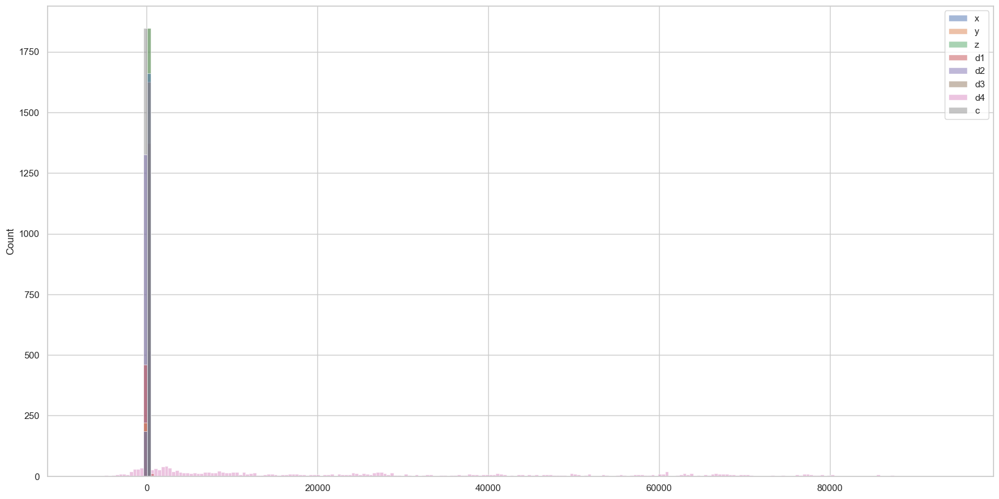

In [112]:
plt.figure(figsize=(20,10))
sns.histplot(data=df_mystery_sep2)
plt.show()

Min and max of d4 are extreme.  May consider graphing log of that one later, 
For now regraph with the other values: 

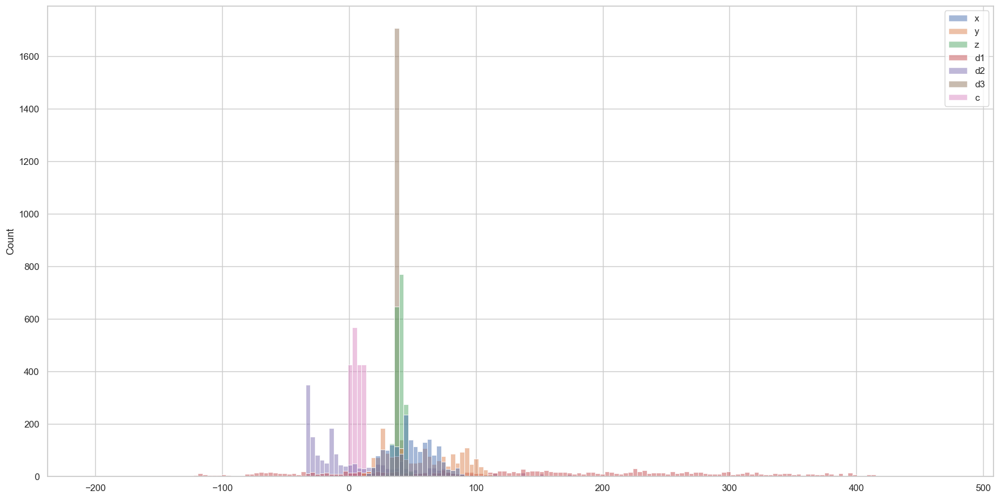

In [113]:
df_non_extremes = df_mystery_sep2[['x', 'y', 'z', 'd1', 'd2', 'd3', 'c']]
plt.figure(figsize=(20,10))
sns.histplot(data = df_non_extremes)
plt.show()

hmm... still not easy to read. graph each individually to see how they look on their own scales.

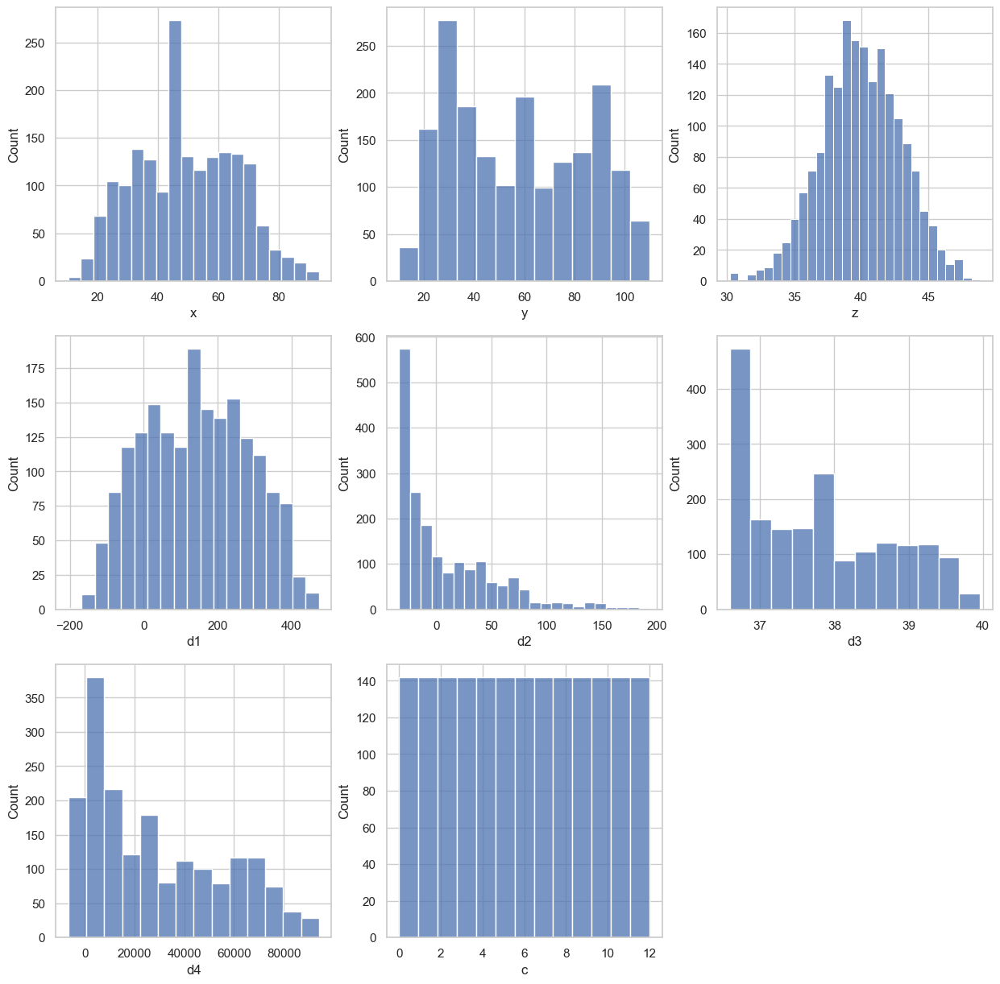

In [114]:
cols = ['x', 'y', 'z', 'd1', 'd2', 'd3', 'd4', 'c']

plt.figure(figsize= (15,15))
for col in cols:
    i = 331 + (cols.index(col))
    plt.subplot(i)
    sns.histplot(df_mystery_sep2[col])
plt.show()

None of the values appear to be centered at 0, so it looks like if we train we should train for a function with a bias. (+ $\theta$<sub>0</sub>)

Take a look at the distribution of each column with scatterplots

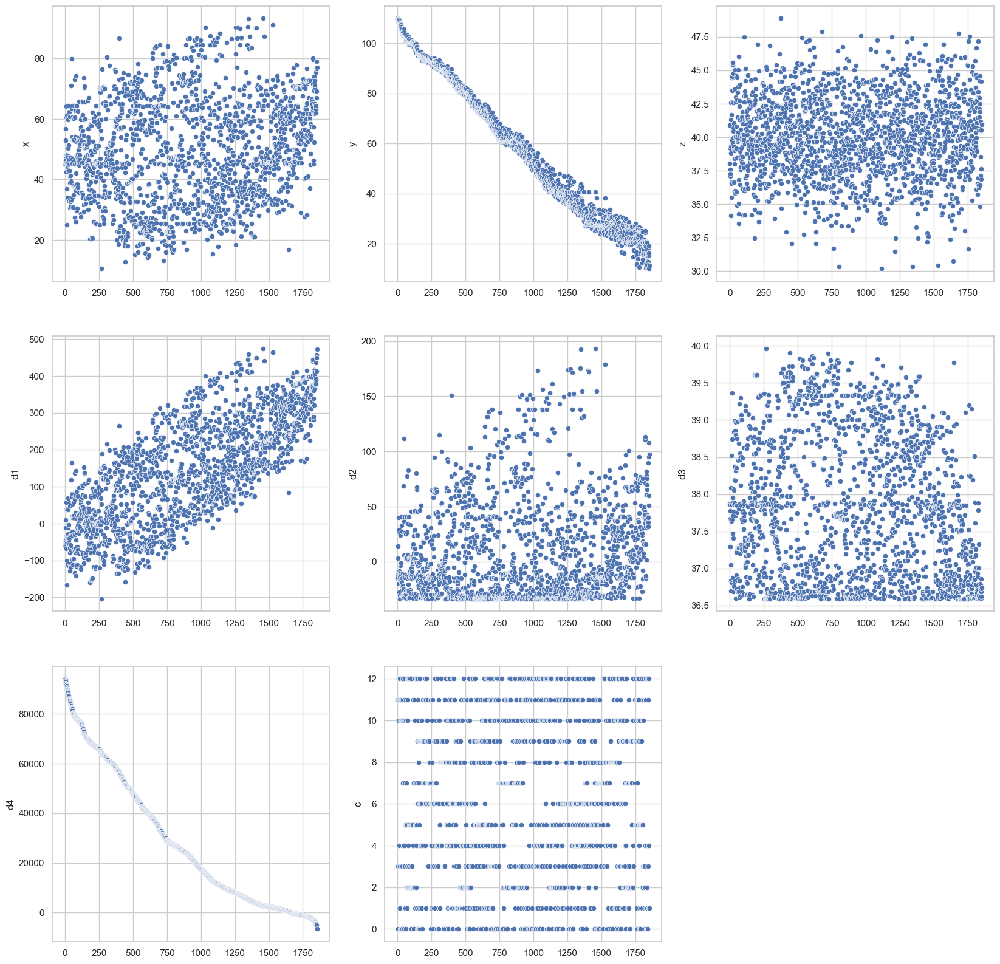

In [115]:
cols = ['x', 'y', 'z', 'd1', 'd2', 'd3', 'd4', 'c']

plt.figure(figsize= (20,20))
for col in cols:
    i = 331 + (cols.index(col))
    plt.subplot(i)
    sns.scatterplot(df_mystery_sep2[col])
plt.show()

This helps us better see the SHAPE of the distributions, but since their scales are adjusted.
The previous graph helps to give perspective on true scale in relation to eachother.
d4's distribution looks like a sigmoid function

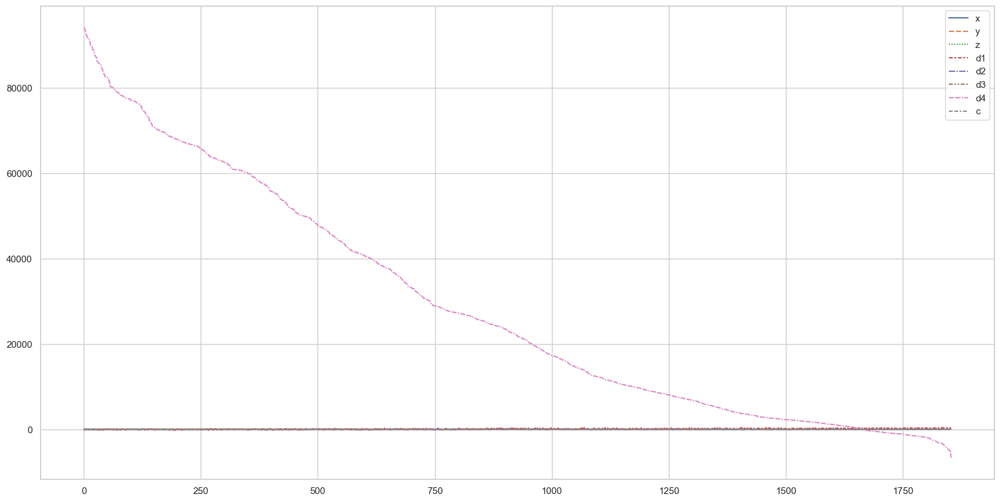

In [116]:
plt.figure(figsize=(20,10))
sns.lineplot(data=df_mystery_sep2)
plt.show()

Scale of d4 is so extreme, it shrinks all of the other columns to indistinguishable.
Take a look at them seperatley.

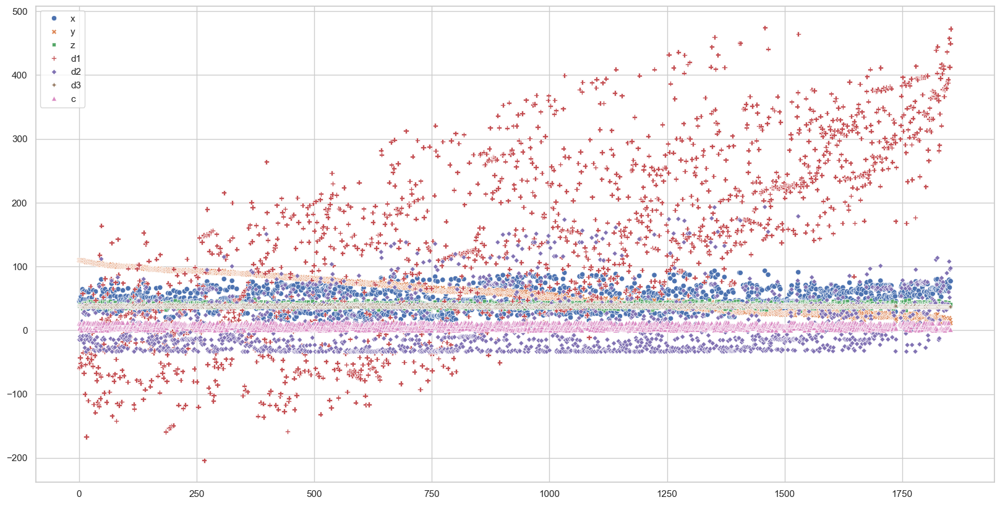

In [117]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=df_non_extremes)
plt.show()

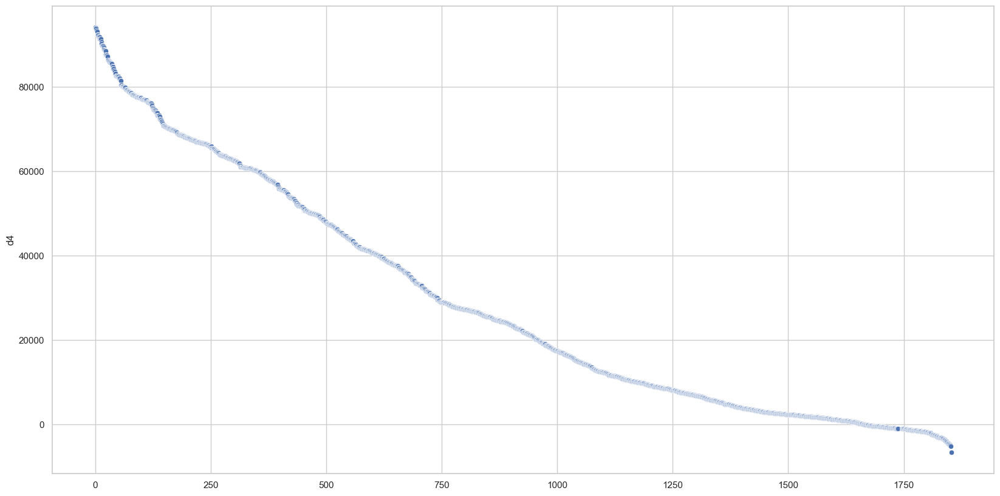

In [118]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=df_mystery_sep2['d4'])
plt.show()

Not sure how helpful that is.

Take a look at correlations

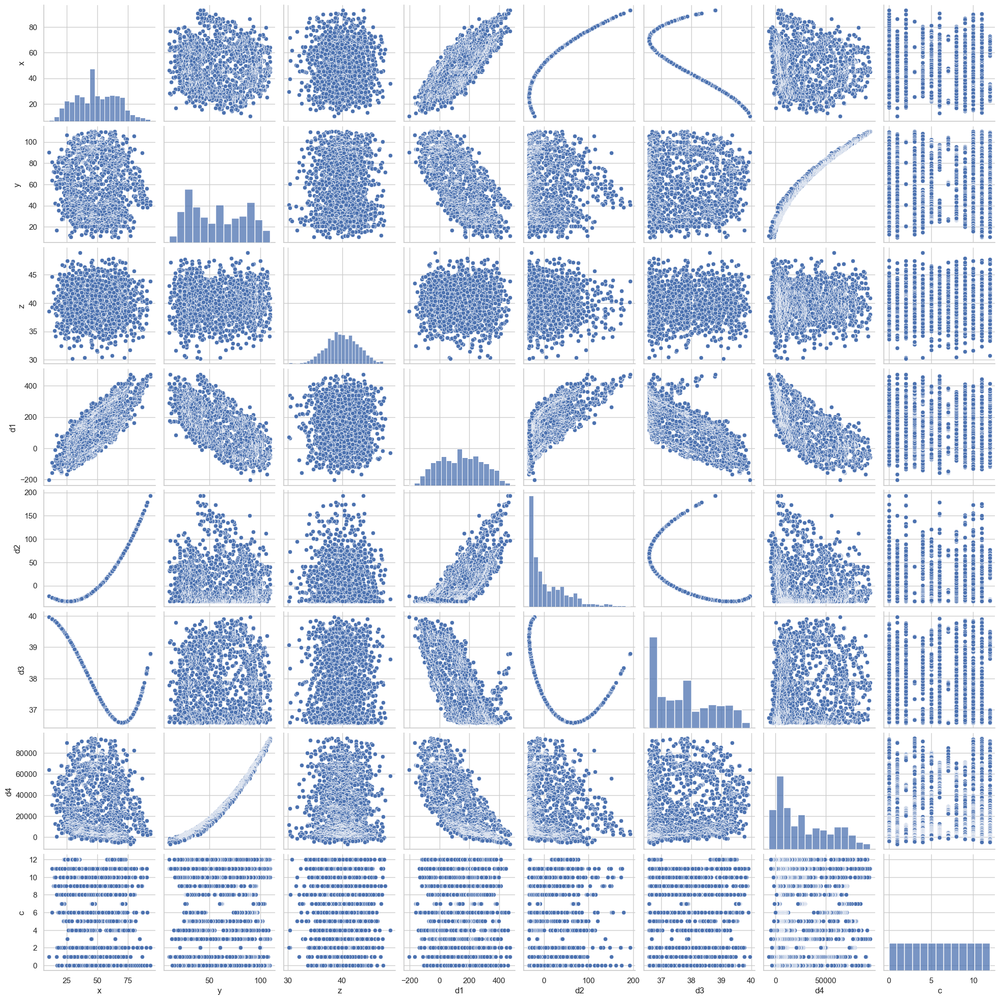

In [119]:
sns.pairplot(df_mystery_sep2)
plt.show()

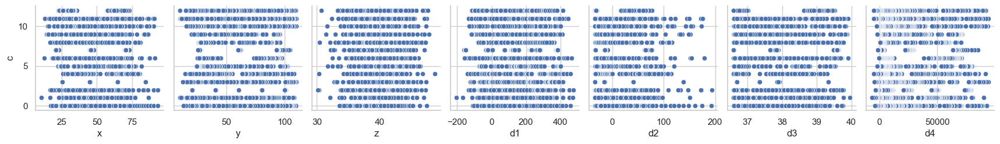

In [120]:
preds = ['x', 'y', 'z', 'd1', 'd2', 'd3', 'd4']
sns.pairplot(df_mystery_sep2, x_vars=preds, y_vars='c')
plt.show()

'c' definitely appears categorical

What did dropping the -999s do to the correlations?

In [121]:
# checking correlation coeffs before dropping the -999s
corr = df_mystery_sep.corr()
corr

,x,y,z,d1,d2,d3,d4,c
x,1.000000,0.900811,0.970979,0.614958,0.931553,0.968659,0.042991,-0.008508
y,0.900811,1.000000,0.931755,0.216572,0.765811,0.932928,0.420782,-0.008185
z,0.970979,0.931755,1.000000,0.469802,0.832811,0.998940,0.072381,-0.008566
d1,0.614958,0.216572,0.469802,1.000000,0.737677,0.460287,-0.599303,-0.003982
d2,0.931553,0.765811,0.832811,0.737677,1.000000,0.827831,-0.012223,-0.007279
d3,0.968659,0.932928,0.998940,0.460287,0.827831,1.000000,0.073970,-0.008938
d4,0.042991,0.420782,0.072381,-0.599303,-0.012223,0.073970,1.000000,-0.000711
c,-0.008508,-0.008185,-0.008566,-0.003982,-0.007279,-0.008938,-0.000711,1.000000


In [122]:
# checking the correlation coeffs AFTER dropping the -999s
corr2 = df_mystery_sep2.corr()
corr2

,x,y,z,d1,d2,d3,d4,c
x,1.000000,-0.066019,0.009865,0.764230,0.932531,-0.911707,-0.118146,0.000064
y,-0.066019,1.000000,-0.005728,-0.693648,-0.058757,0.057258,0.981174,-0.000012
z,0.009865,-0.005728,1.000000,0.031862,0.000407,-0.020037,-0.008786,0.004511
d1,0.764230,-0.693648,0.031862,1.000000,0.710669,-0.695092,-0.719156,0.000149
d2,0.932531,-0.058757,0.000407,0.710669,1.000000,-0.726094,-0.132387,0.000059
d3,-0.911707,0.057258,-0.020037,-0.695092,-0.726094,1.000000,0.081241,-0.011880
d4,-0.118146,0.981174,-0.008786,-0.719156,-0.132387,0.081241,1.000000,-0.000072
c,0.000064,-0.000012,0.004511,0.000149,0.000059,-0.011880,-0.000072,1.000000


dropping -999s significantly changes the correlation coefficients. 

Is there any pattern in how 'c' depends on each column?

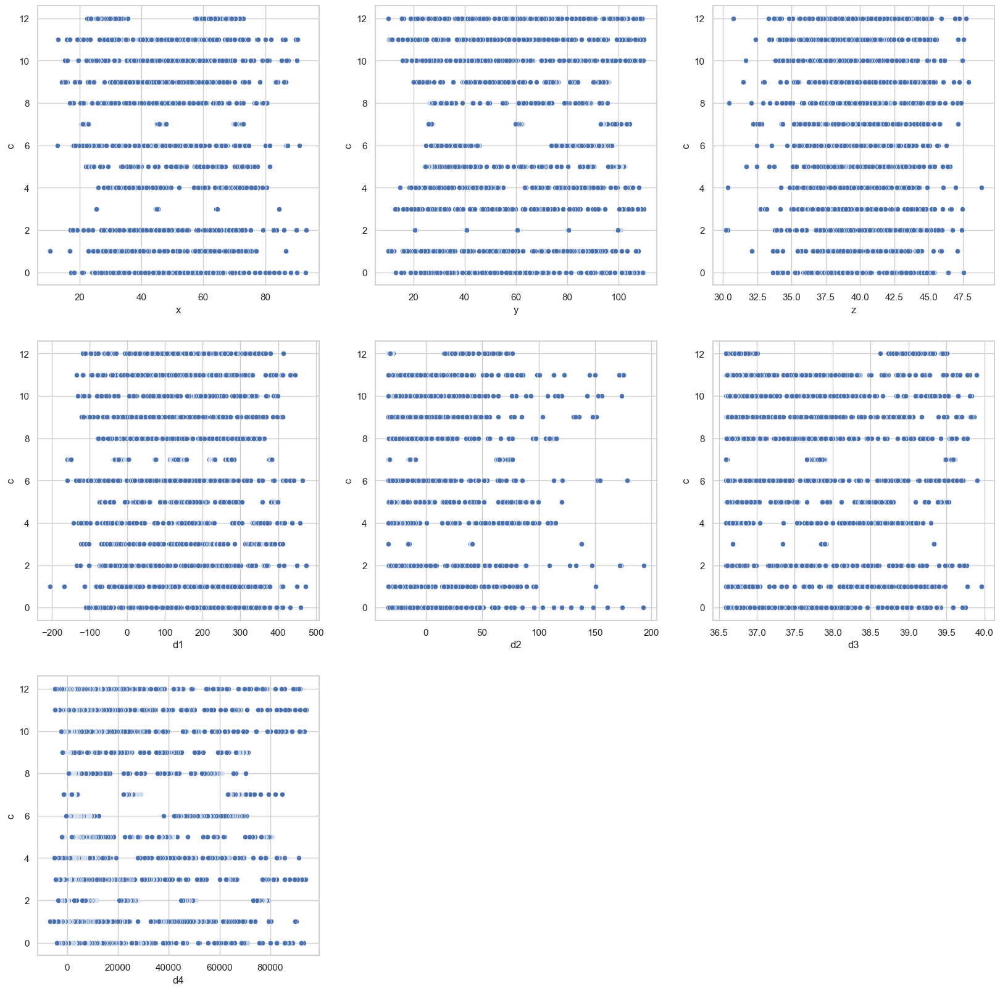

In [123]:
vars = ['x', 'y', 'z', 'd1', 'd2', 'd3', 'd4']

plt.figure(figsize= (20,20))
for var in vars:
    i = 331 + (vars.index(var))
    plt.subplot(i)
    sns.scatterplot(data = df_mystery_sep2, x = var, y = 'c')
plt.show()

# Applying hint from TA

Hint from TA

In [ ]:
col = 'c'
v1 = 'x'
v2 = 'd1'

# store unique values of column (like the categories of c)
unique_vals = df_mystery_sep2[col].unique()

# for each of the unique vlaues, calculate mean, var, correlation for two of the columns
for val in unique_vals:
    val_data = df_mystery_sep2[df_mystery_sep2[col] == val]
    
    mean_v1 = val_data[v1].mean()
    mean_v2 = val_data[v2].mean()
    var_v1 = val_data[v1].var()
    var_v2 = val_data[v2].var()
    correlation_12 = val_data[v1].corr(val_data[v2])
    
    print(f"\n {val}:")
    print("  Mean of ", v1, f":       {mean_v1:.1f}")
    print("  Mean of ", v2, f":      {mean_v2:.1f}")
    print("  Variance of ", v1, f":  {var_v1:.1f}")
    print("  Variance of ", v2, f":  {var_v2:.1f}")
    print("  Correlation ",(v1, v2), f": {correlation_12:.2f}")
    print(f"  Sample size:    {len(val_data)}")


 11.0:
  Mean of  x :       49.2
  Mean of  d1 :      142.9
  Variance of  x :  281.1
  Variance of  d1 :  20245.2
  Correlation  ('x', 'd1') : 0.77
  Sample size:    142

 3.0:
  Mean of  x :       49.2
  Mean of  d1 :      143.0
  Variance of  x :  281.2
  Variance of  d1 :  20155.9
  Correlation  ('x', 'd1') : 0.77
  Sample size:    142

 10.0:
  Mean of  x :       49.2
  Mean of  d1 :      142.7
  Variance of  x :  281.2
  Variance of  d1 :  20051.6
  Correlation  ('x', 'd1') : 0.77
  Sample size:    142

 0.0:
  Mean of  x :       49.2
  Mean of  d1 :      143.0
  Variance of  x :  281.1
  Variance of  d1 :  20060.5
  Correlation  ('x', 'd1') : 0.76
  Sample size:    142

 12.0:
  Mean of  x :       49.2
  Mean of  d1 :      143.4
  Variance of  x :  281.2
  Variance of  d1 :  20130.6
  Correlation  ('x', 'd1') : 0.76
  Sample size:    142

 4.0:
  Mean of  x :       49.2
  Mean of  d1 :      143.2
  Variance of  x :  281.2
  Variance of  d1 :  19944.1
  Correlation  ('x', 'd1') 

Not really sure how new info that added.. but it seems to indicate we should seperate the data into the categories indicated in 'c'

After hint- plotting by value c with x on x axis, and cycle through all of the other columns on the y axis

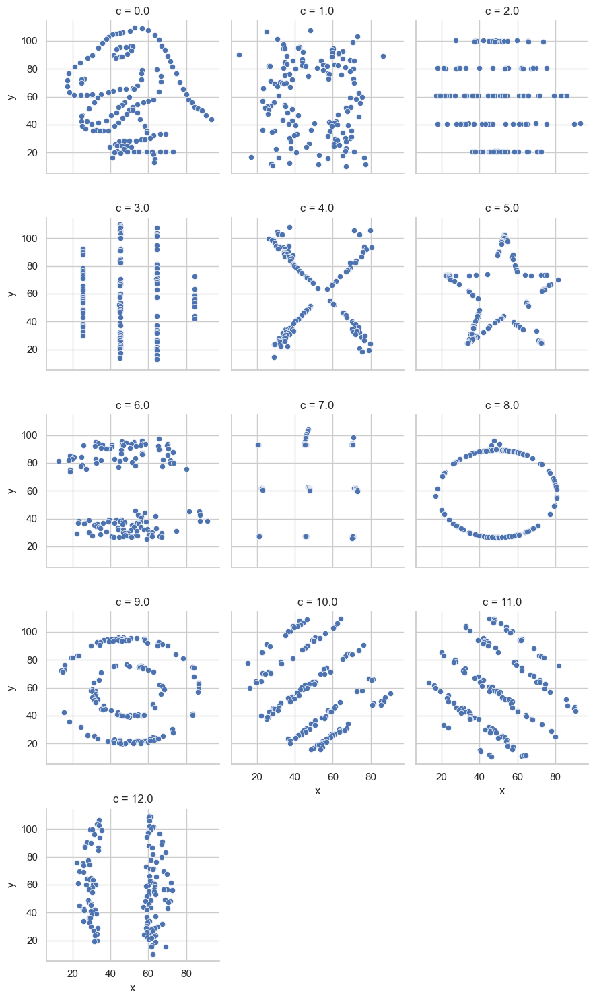

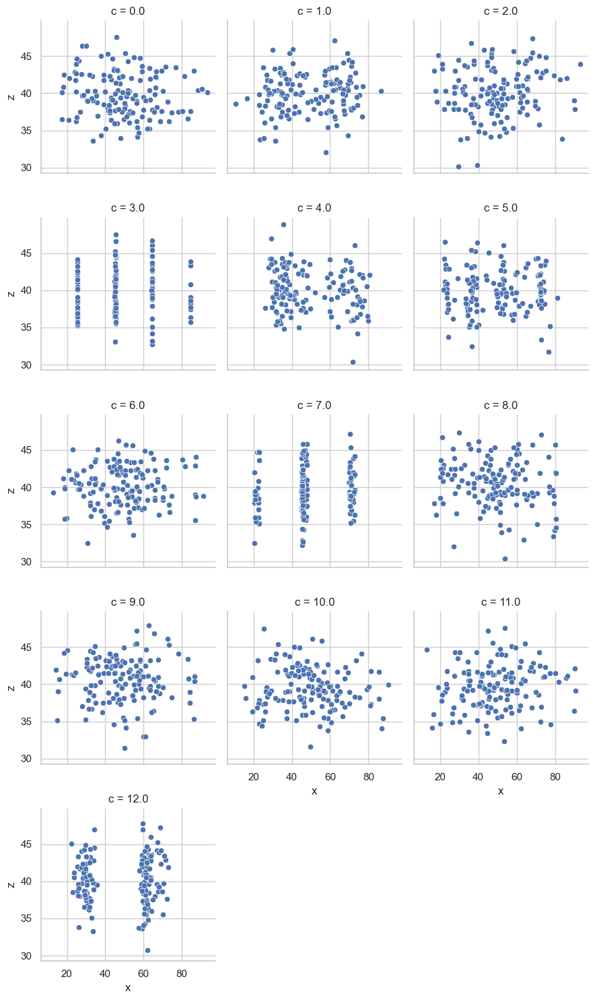

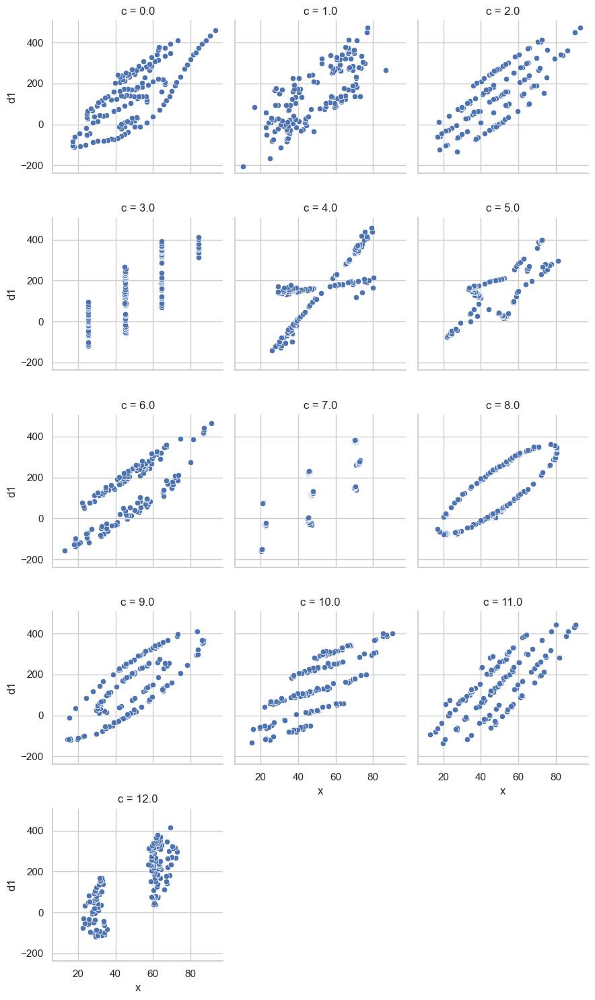

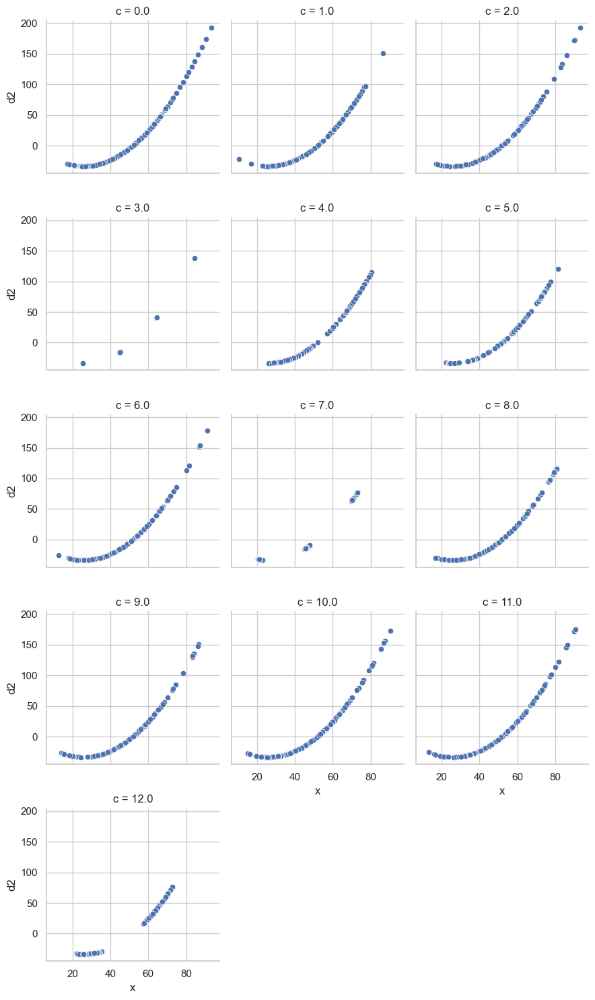

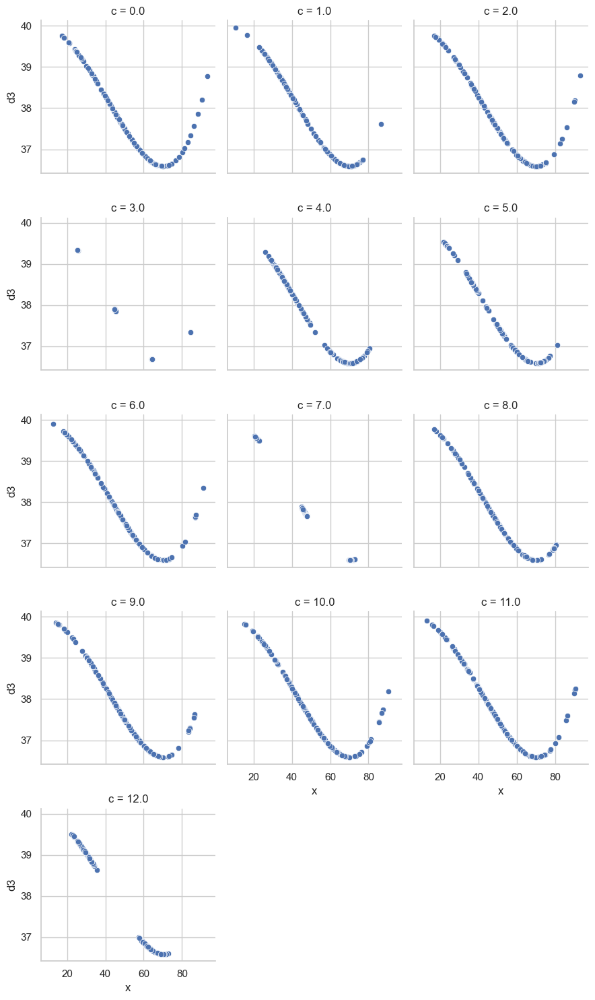

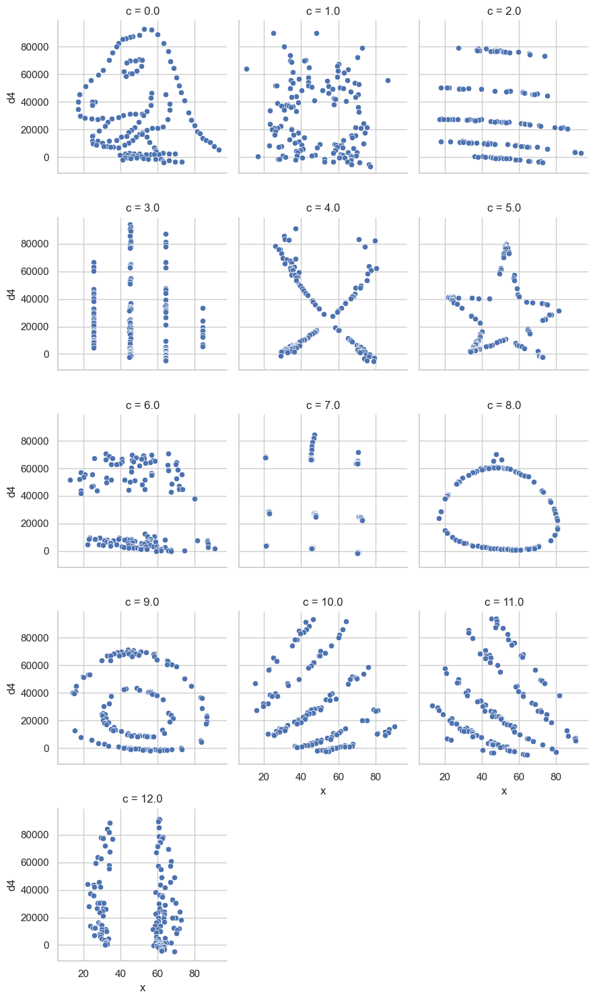

In [127]:
y_vars = ['y', 'z', 'd1', 'd2', 'd3', 'd4']
for y_var in y_vars:
    g = sns.FacetGrid(df_mystery_sep2, col=col, col_wrap=3)
    g.map_dataframe(sns.scatterplot, x='x', y=y_var)
    plt.show()

The data appears to create pictures when seperated into categories and plotted with x on x axis.

d1 and d4 appear to be the result of transforms of the y data, making the same images, but in different positions or on different scales. 

Let's see what happens cycling through the different columns on thex axis

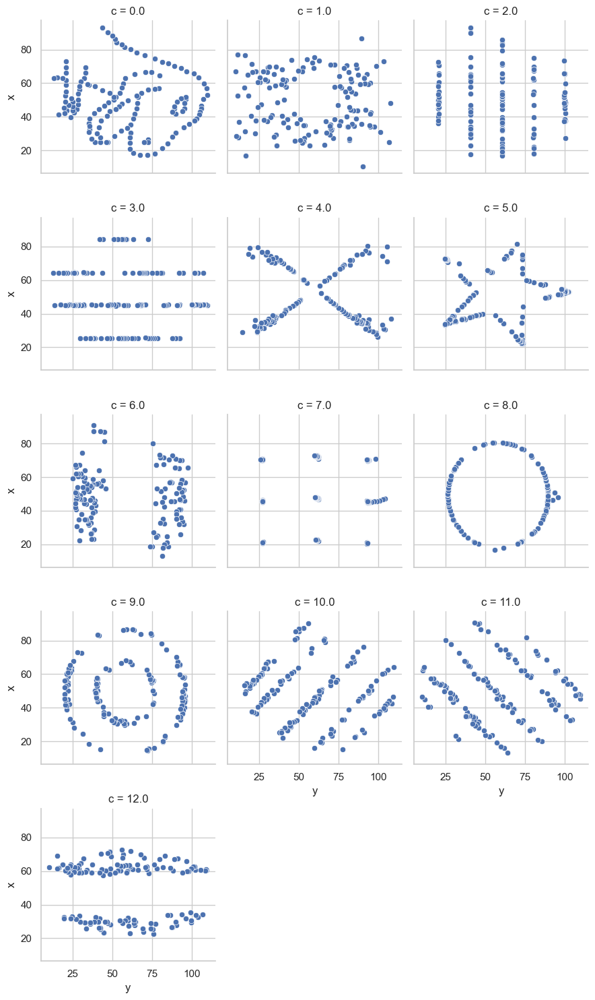

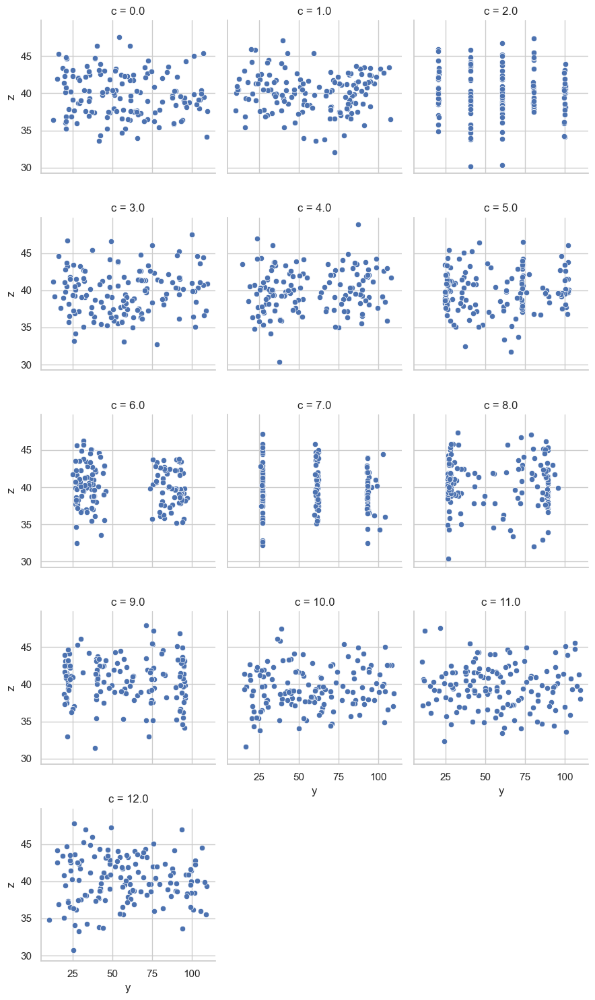

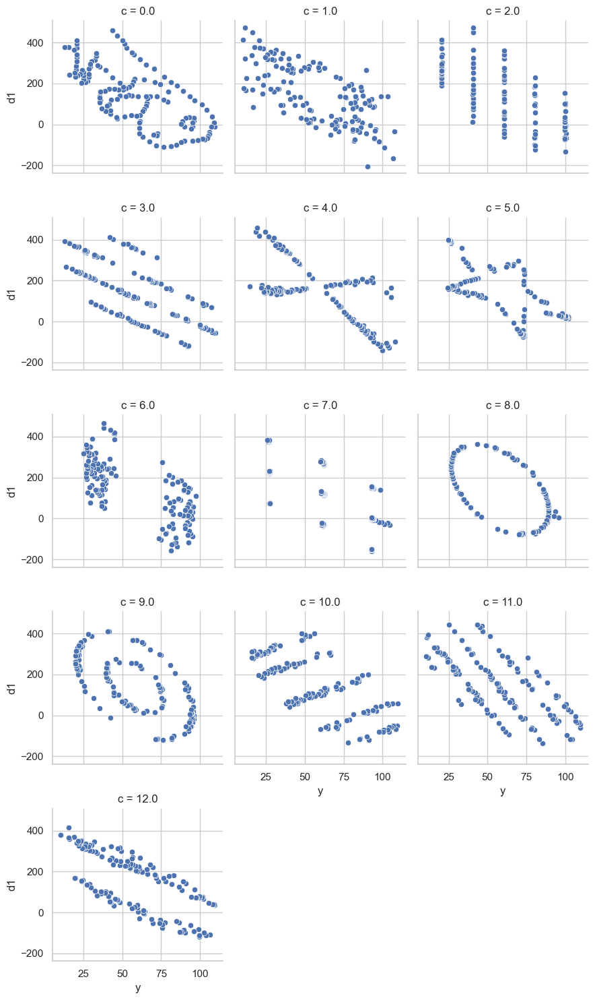

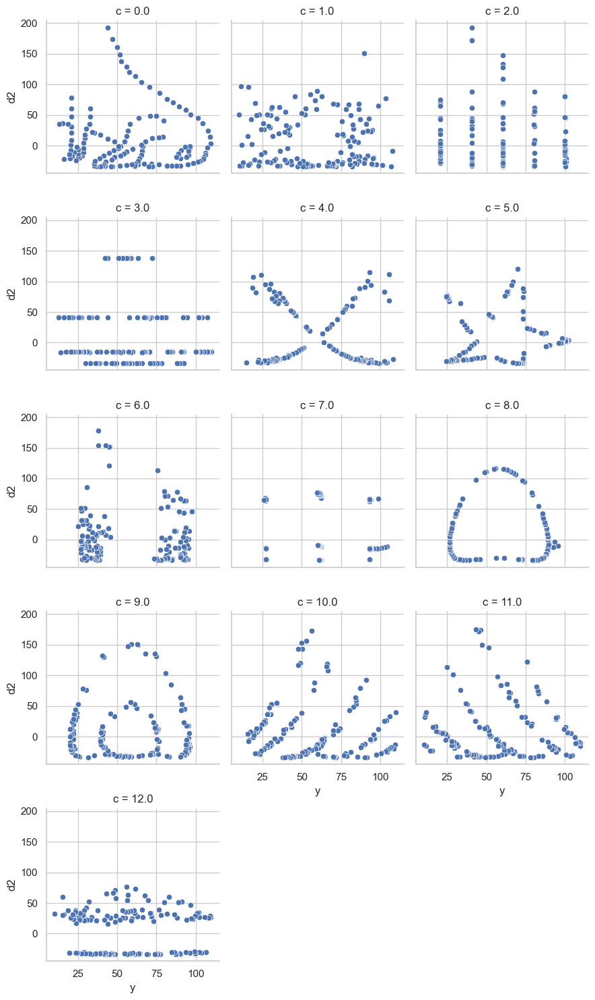

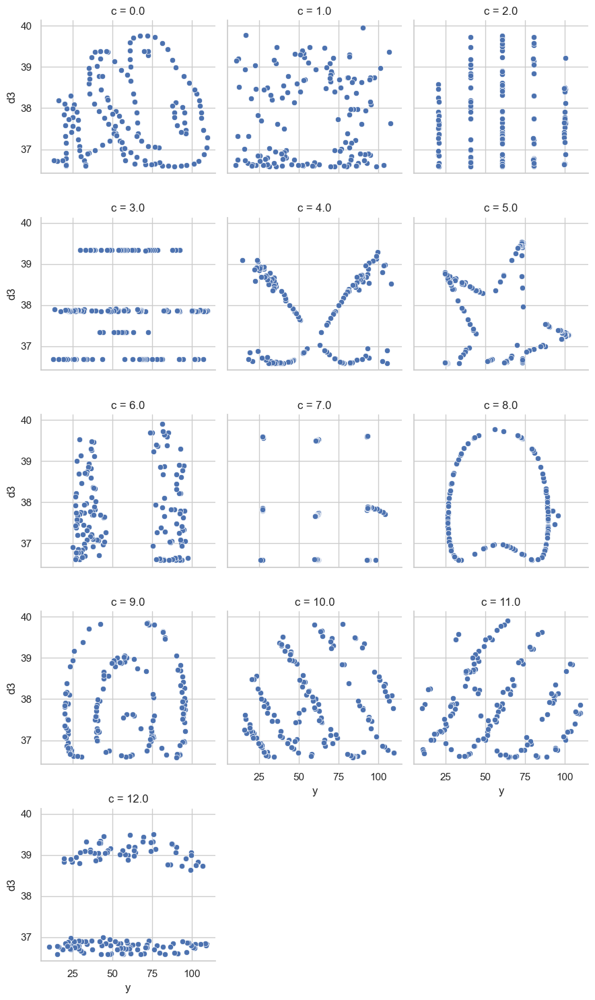

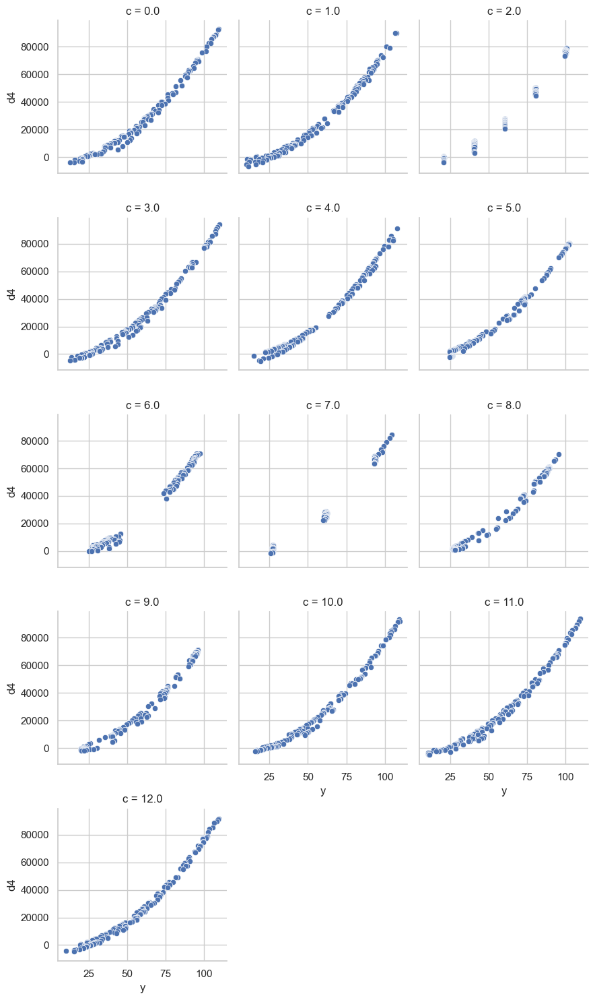

In [128]:
y_vars = ['x', 'z', 'd1', 'd2', 'd3', 'd4']
for y_var in y_vars:
    g = sns.FacetGrid(df_mystery_sep2, col=col, col_wrap=3)
    g.map_dataframe(sns.scatterplot, x='y', y=y_var)
    plt.show()

putting y on the x axis appears to mostly just rotate the images as expected, but also reveals what looks to be an exponential
relationship with d4

by value c with z on x axis

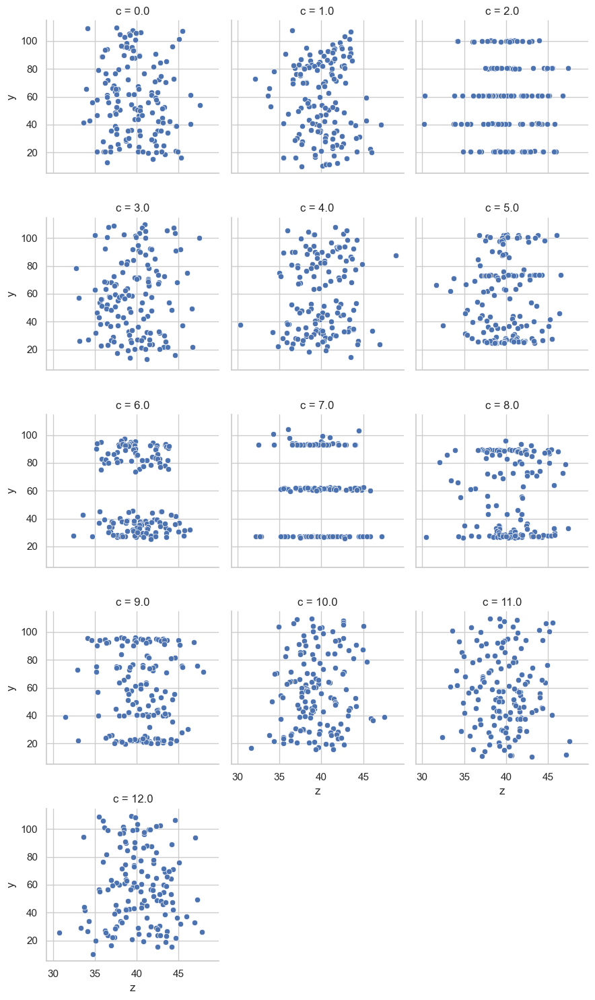

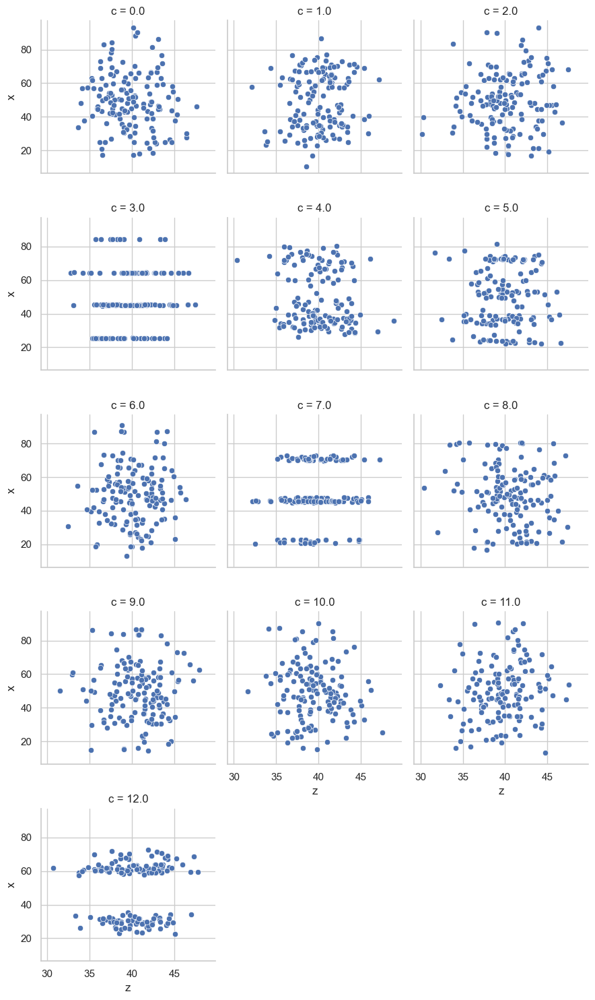

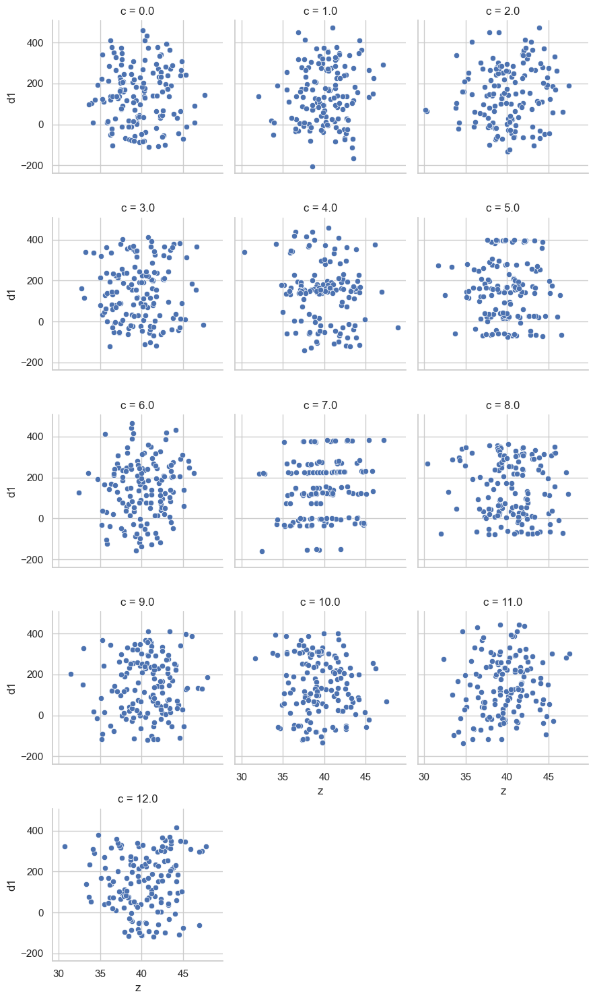

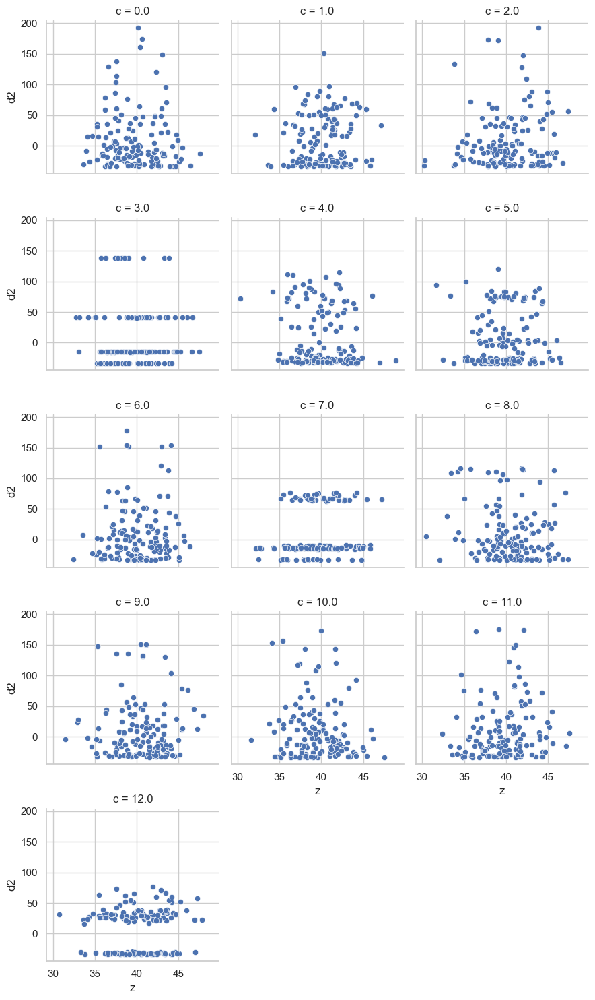

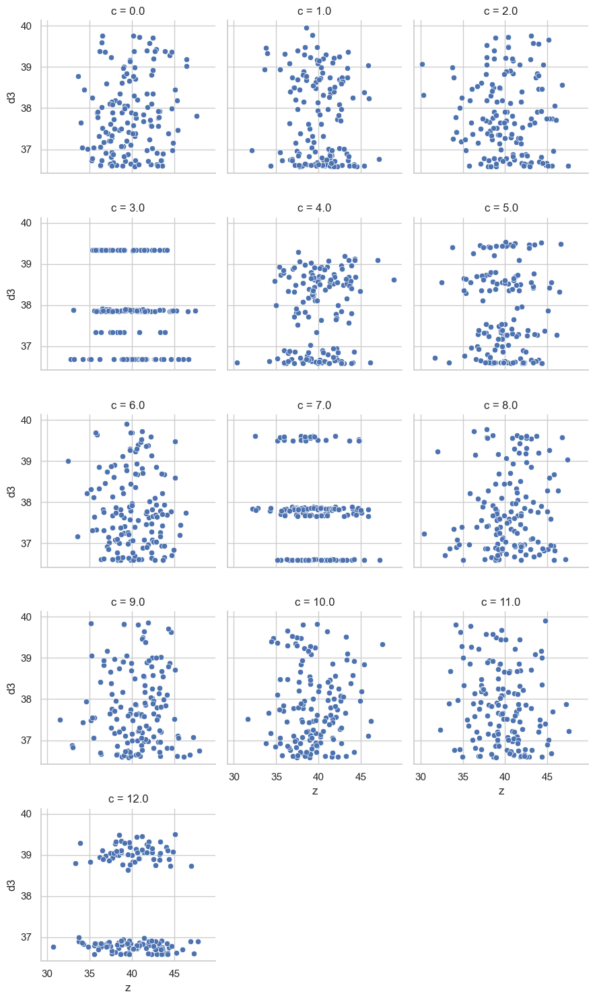

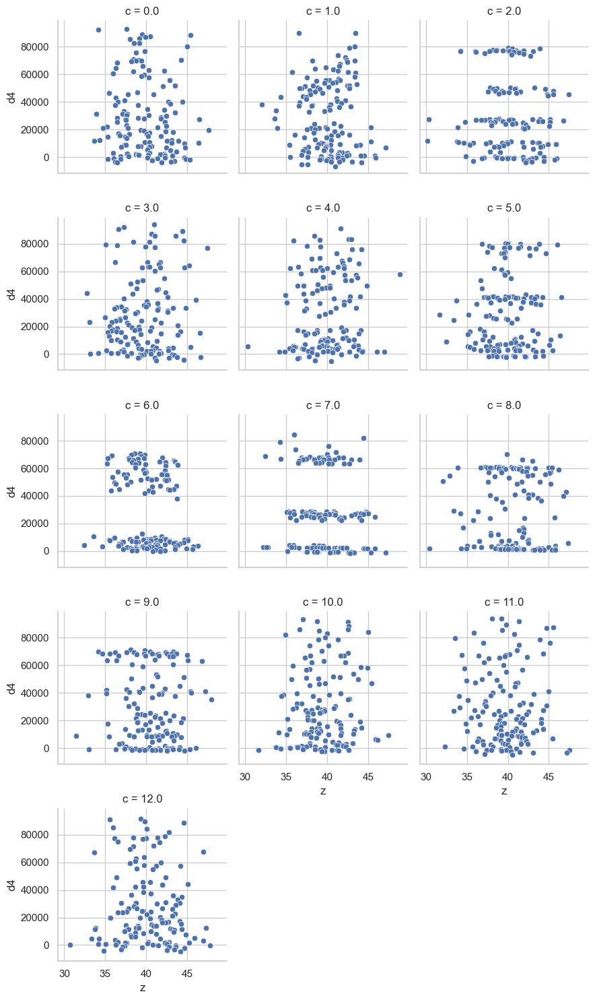

In [129]:
y_vars = ['y', 'x', 'd1', 'd2', 'd3', 'd4']
for y_var in y_vars:
    g = sns.FacetGrid(df_mystery_sep2, col=col, col_wrap=3)
    g.map_dataframe(sns.scatterplot, x='z', y=y_var)
    plt.show()

z does not appear to make any neat pictures with anything. Maybe it's just noise?

by value c with d1 on x axis

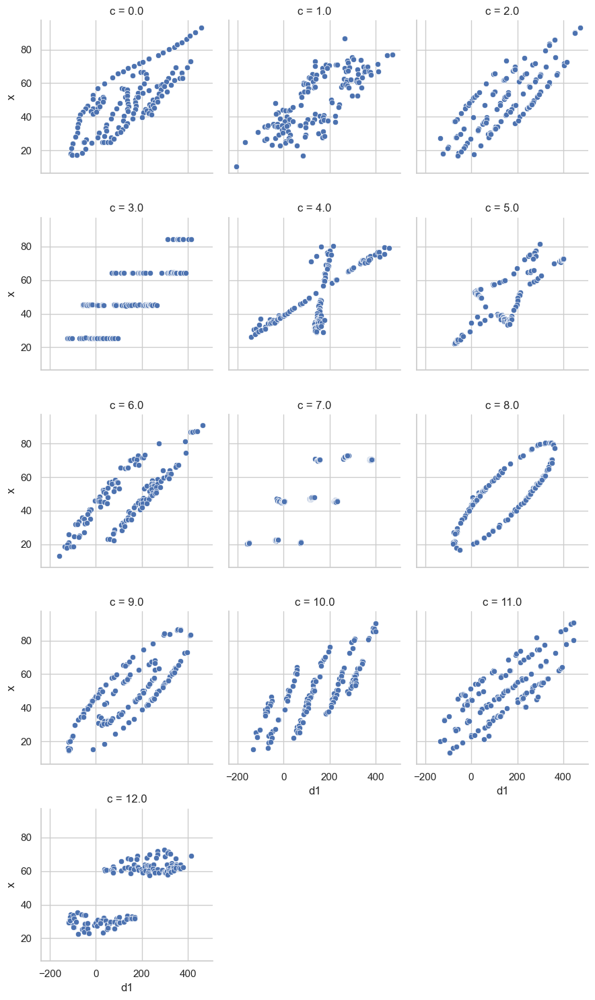

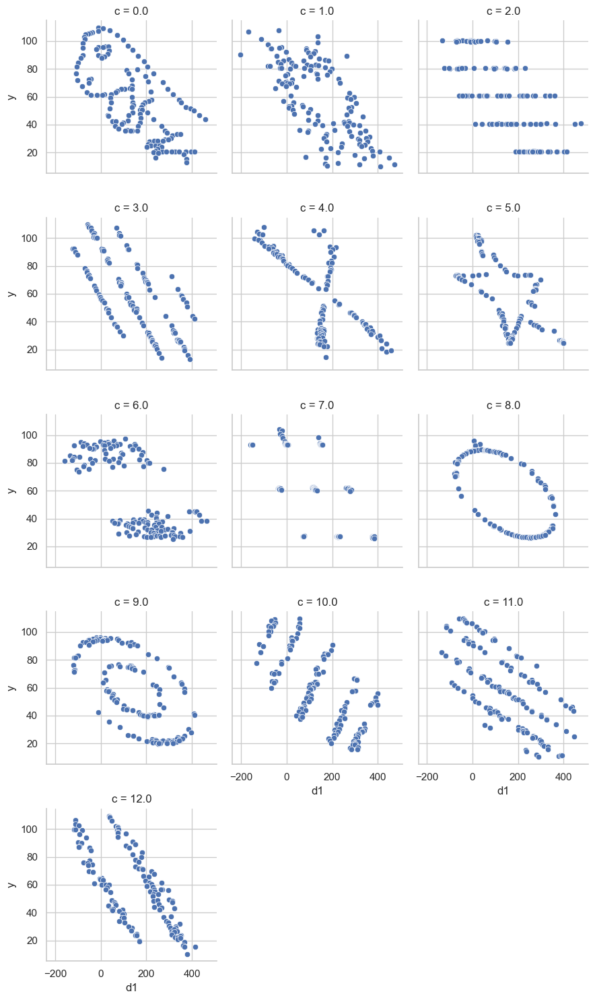

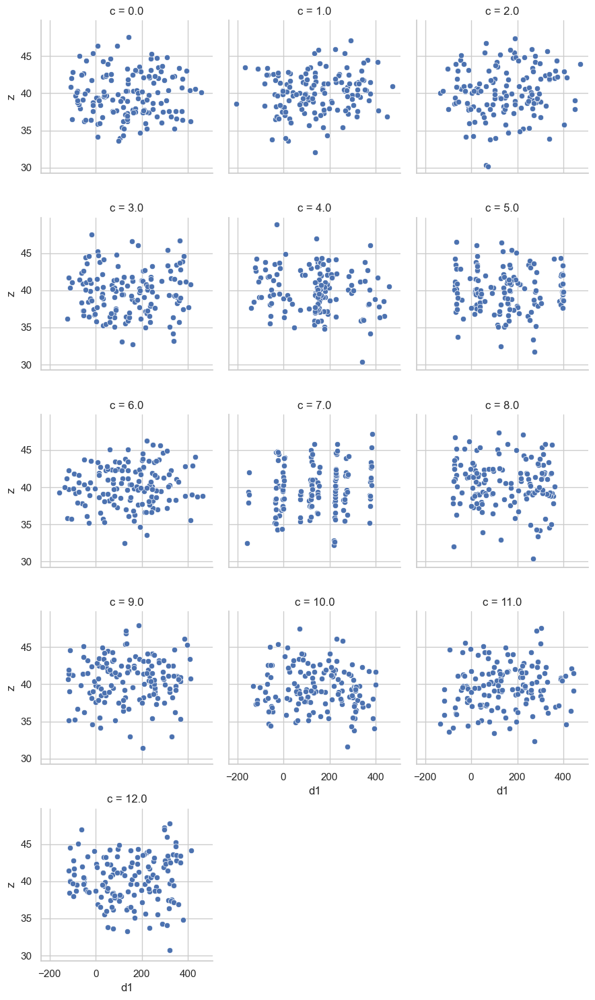

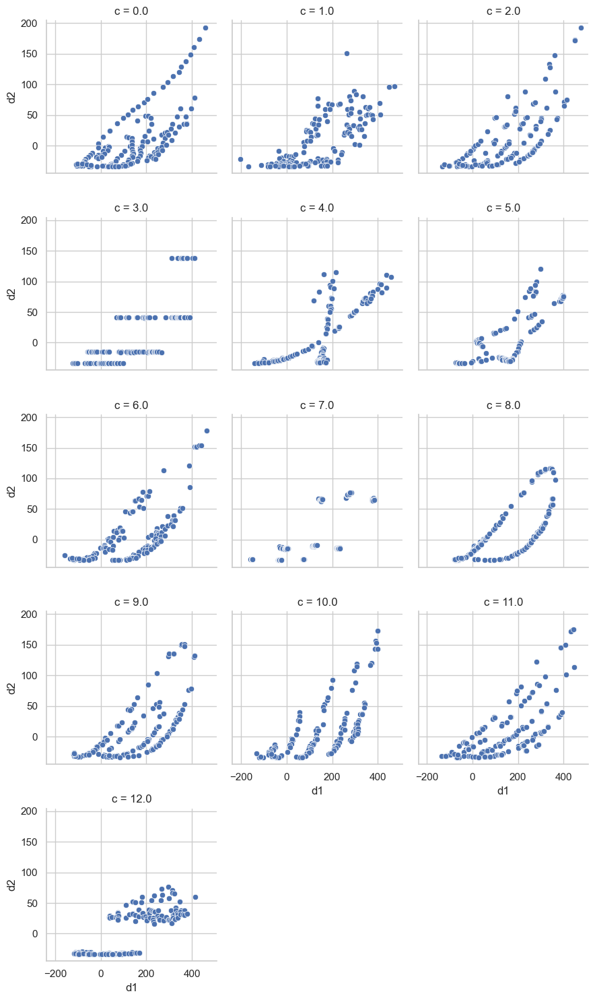

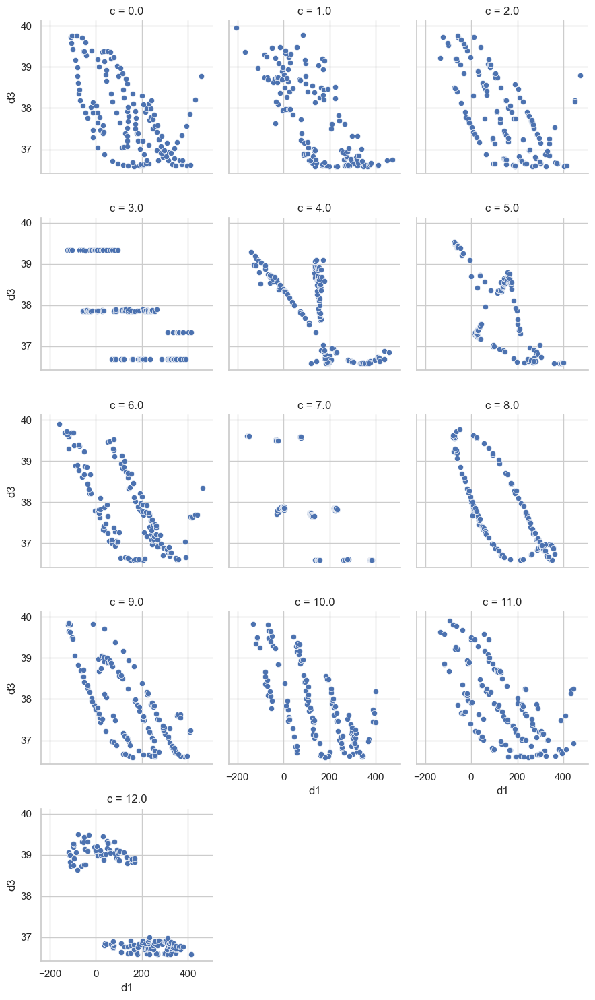

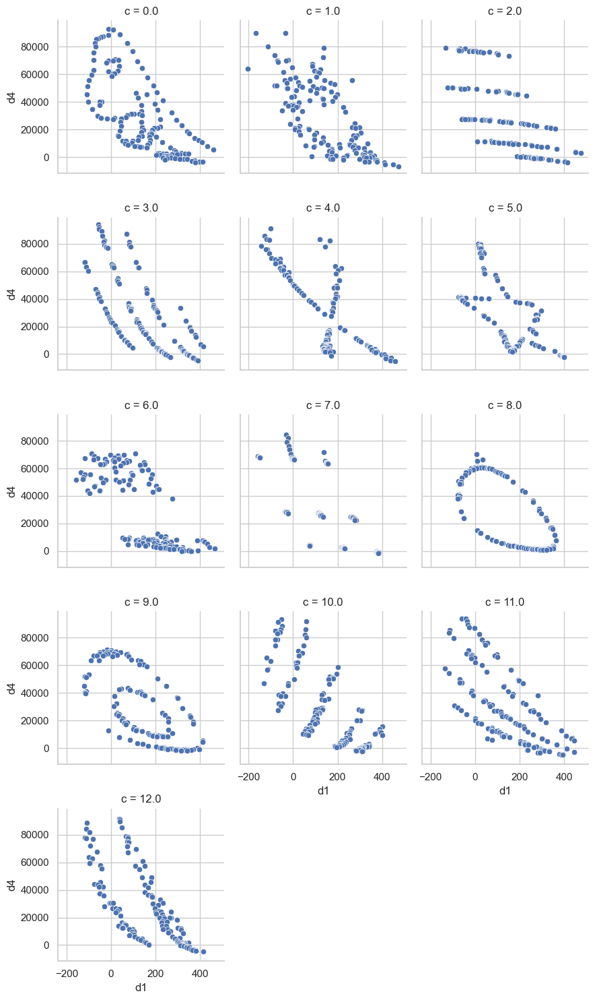

In [130]:
y_vars = ['x', 'y', 'z', 'd2', 'd3', 'd4']
for y_var in y_vars:
    g = sns.FacetGrid(df_mystery_sep2, col=col, col_wrap=3)
    g.map_dataframe(sns.scatterplot, x='d1', y=y_var)
    plt.show()

In looking at these plots, it appears that d2 "smooshes" the images in 
whatever direction the t-rex is facing

by value c with d2 on x axis

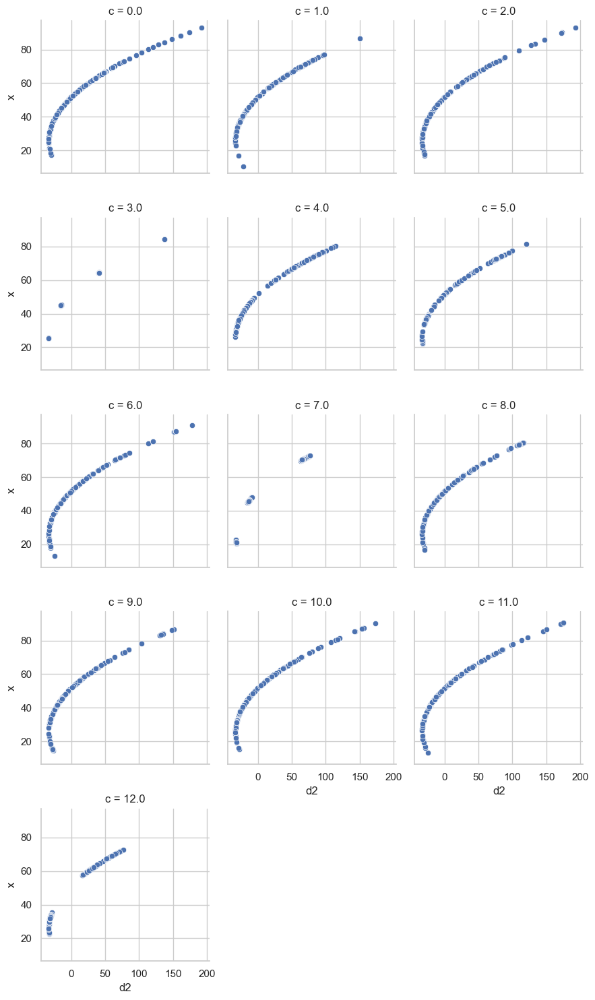

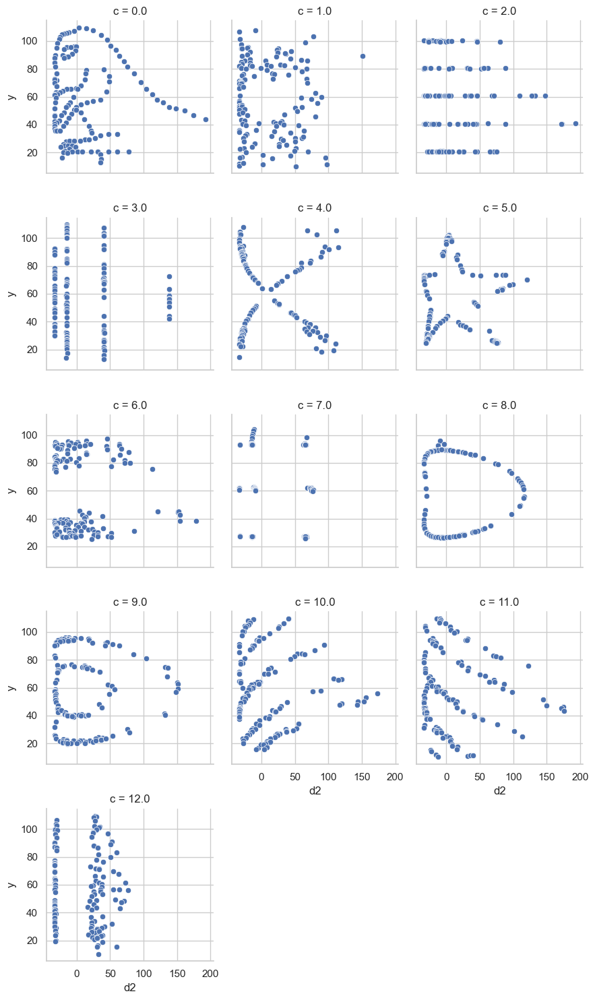

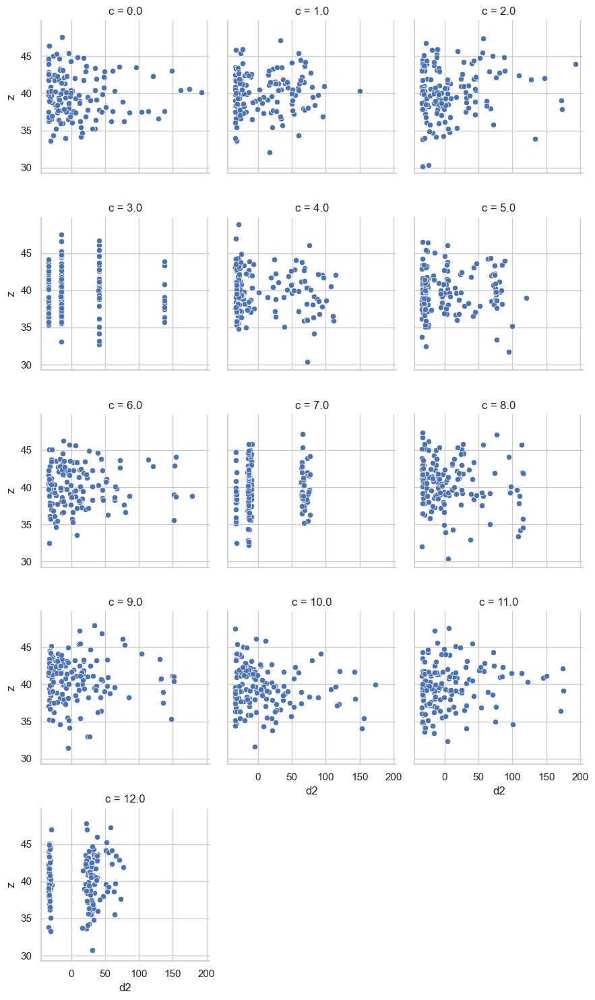

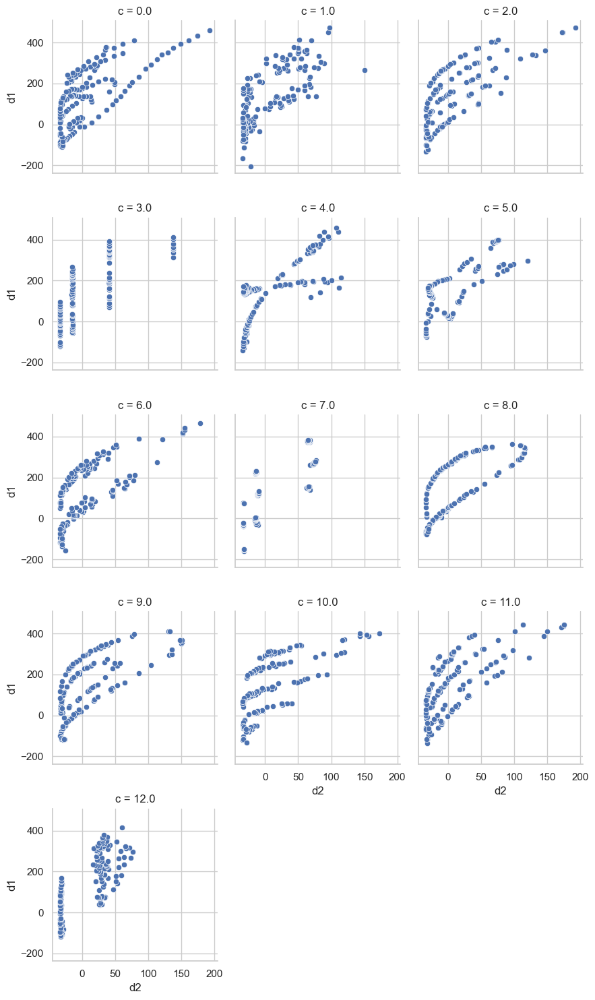

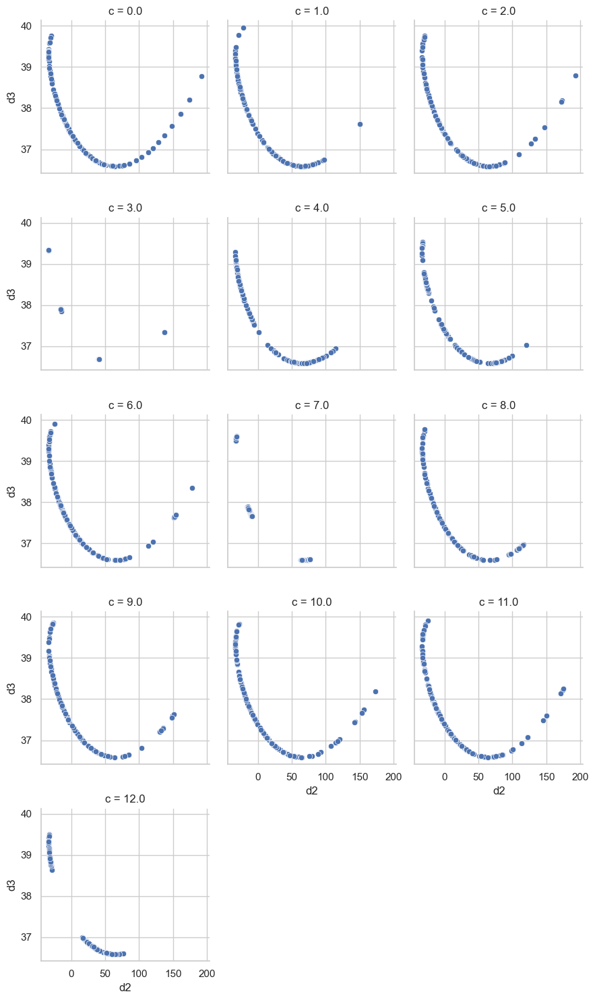

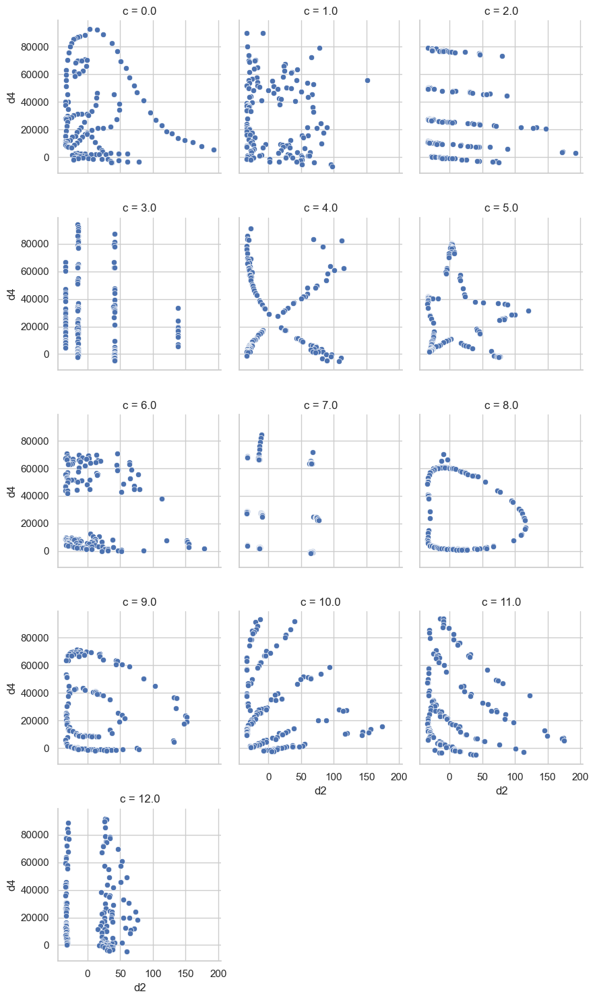

In [131]:
y_vars = ['x', 'y', 'z', 'd1', 'd3', 'd4']
for y_var in y_vars:
    g = sns.FacetGrid(df_mystery_sep2, col=col, col_wrap=3)
    g.map_dataframe(sns.scatterplot, x='d2', y=y_var)
    plt.show()

by value c with d3 on x axis

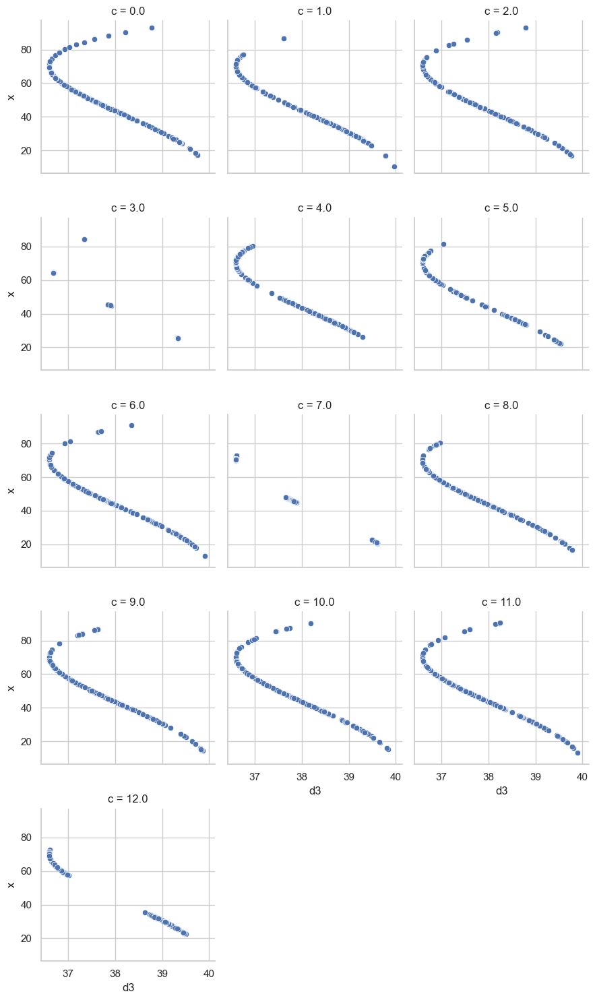

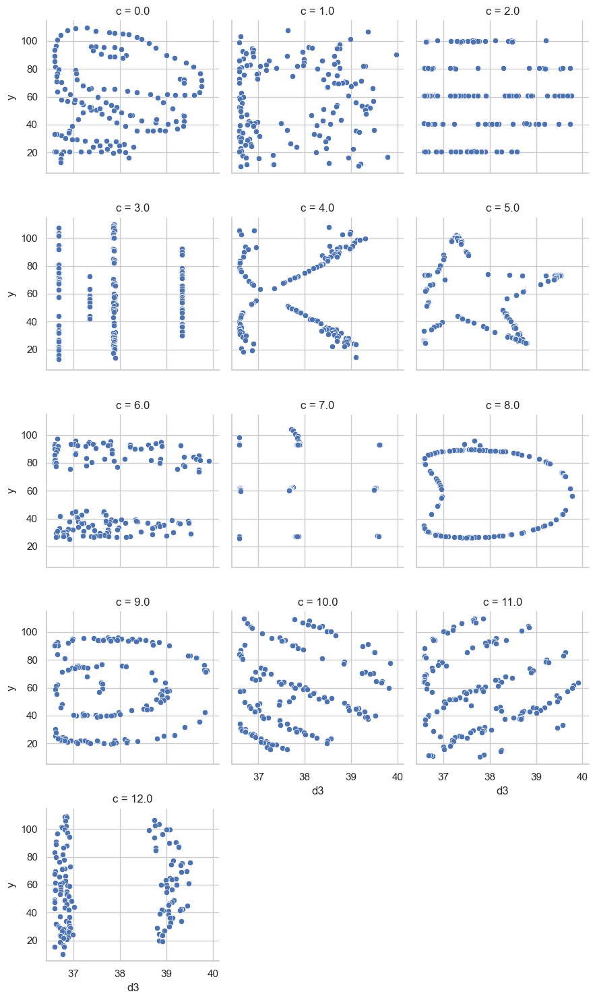

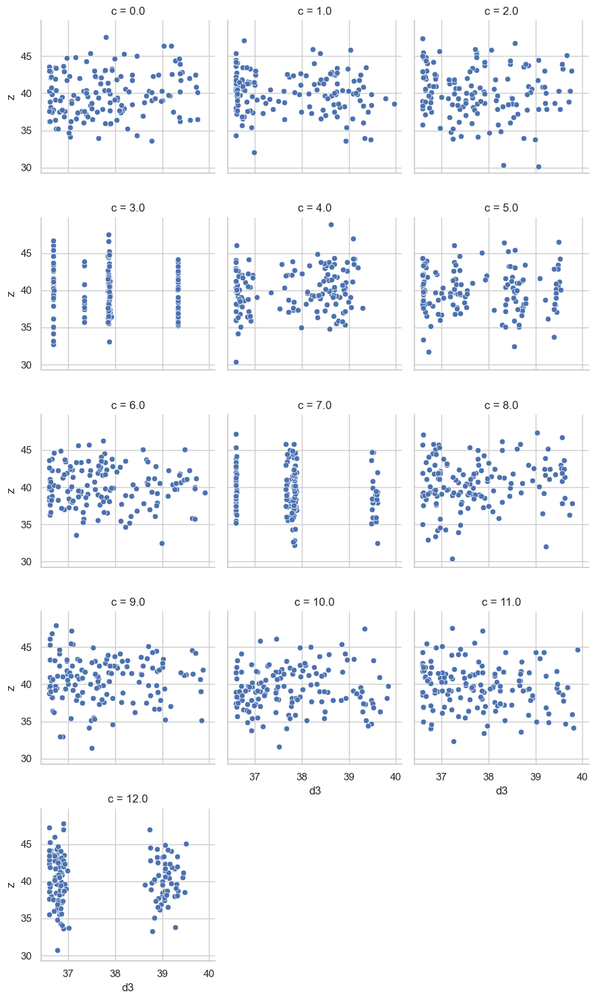

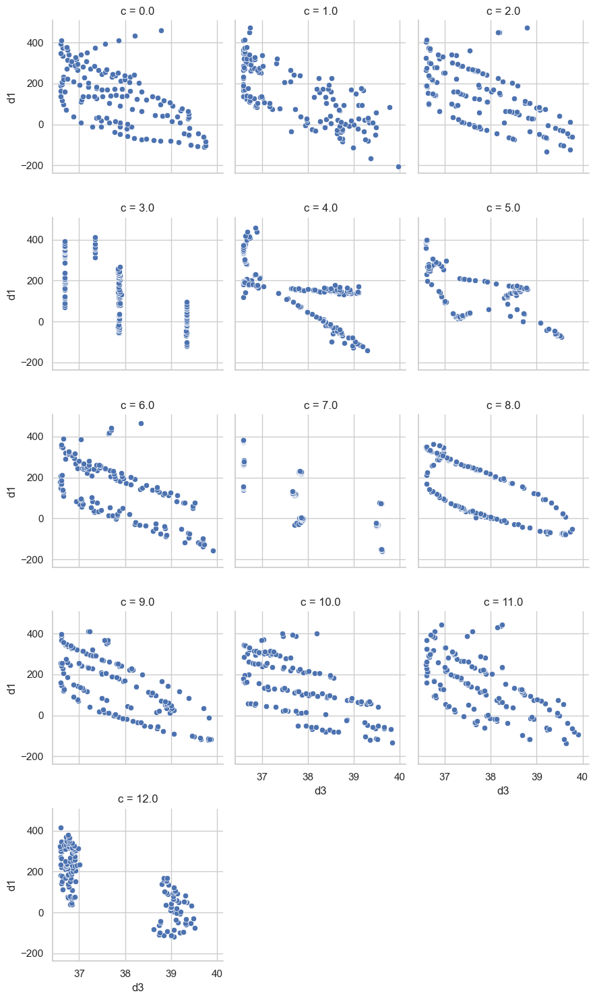

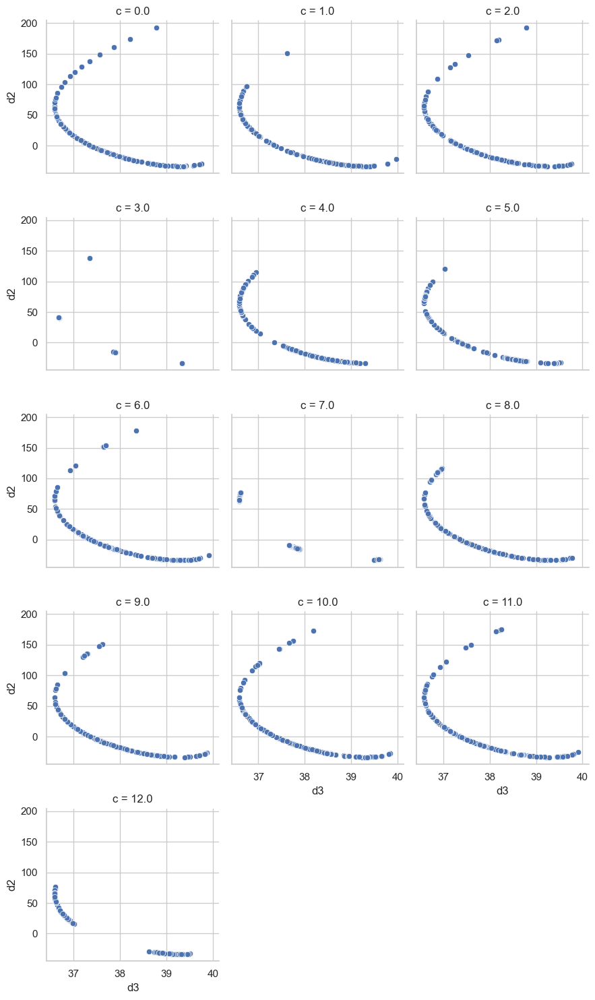

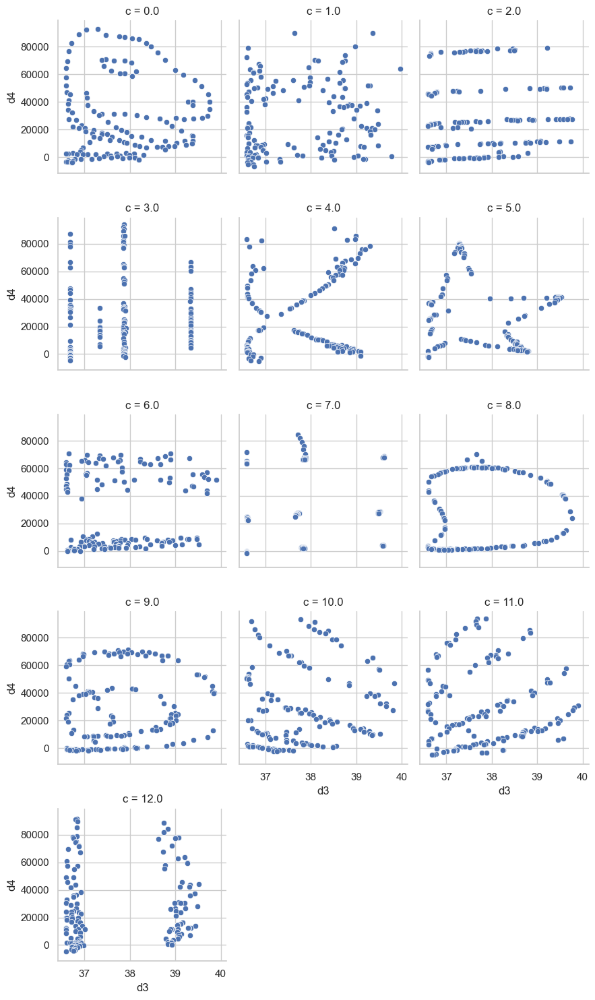

In [132]:
y_vars = ['x', 'y', 'z', 'd1', 'd2', 'd4']
for y_var in y_vars:
    g = sns.FacetGrid(df_mystery_sep2, col=col, col_wrap=3)
    g.map_dataframe(sns.scatterplot, x='d3', y=y_var)
    plt.show()

by value c with d4 on x axis

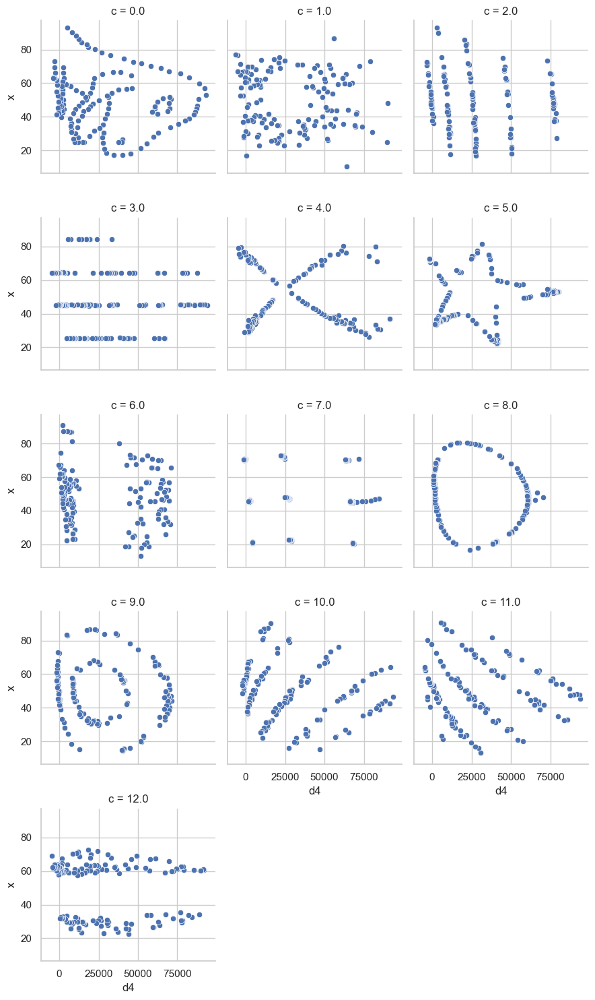

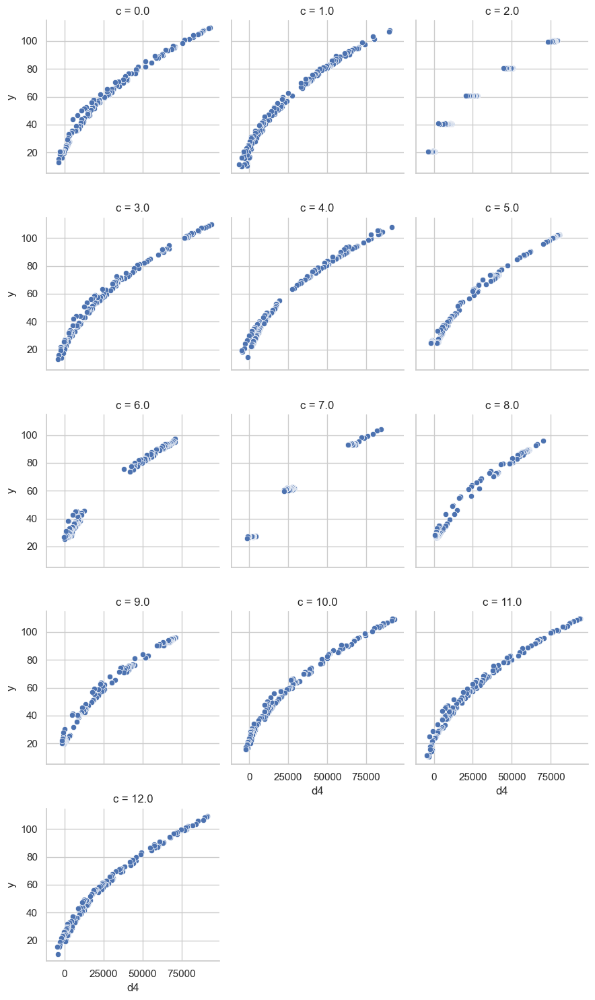

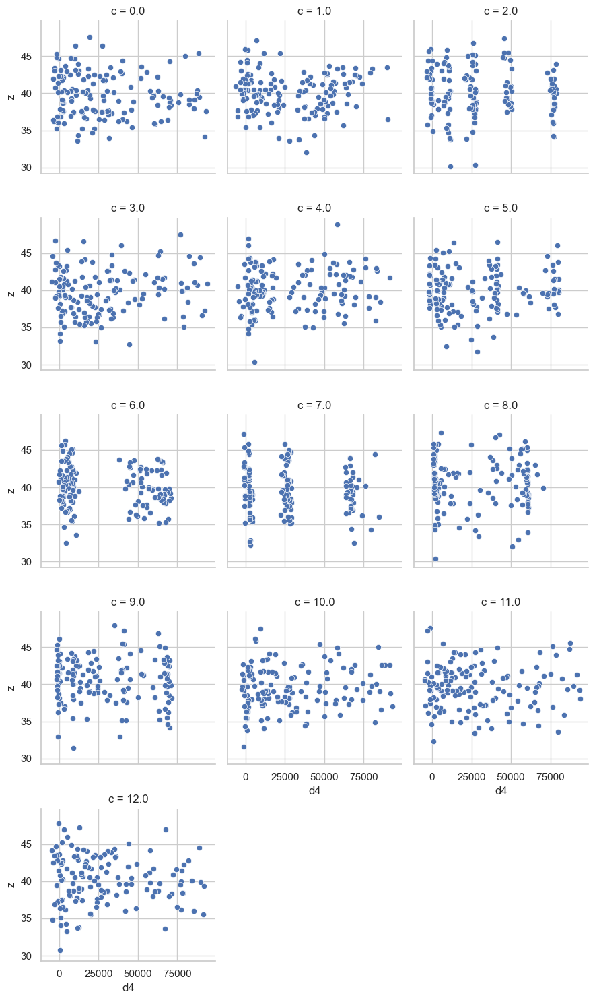

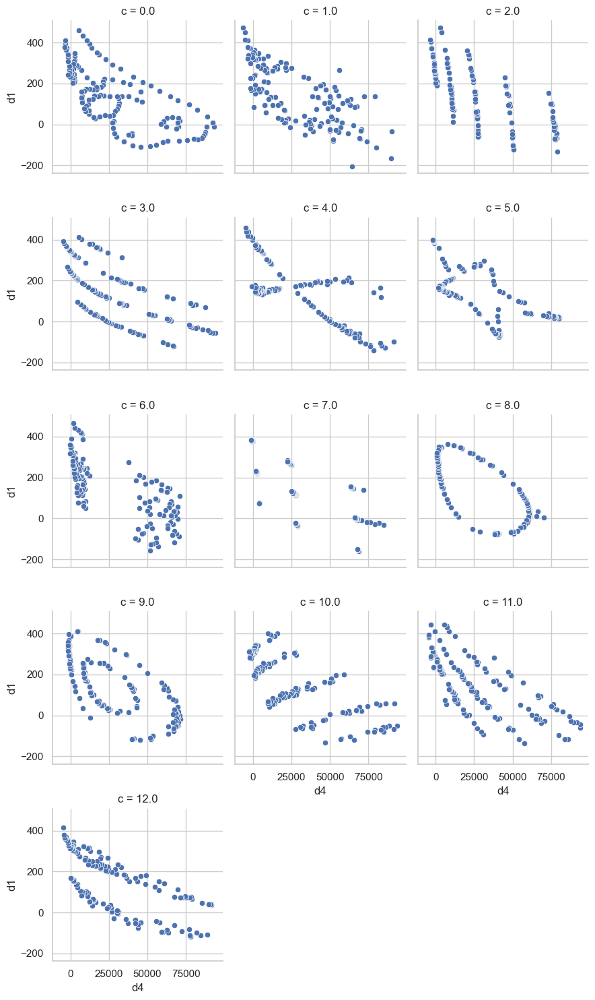

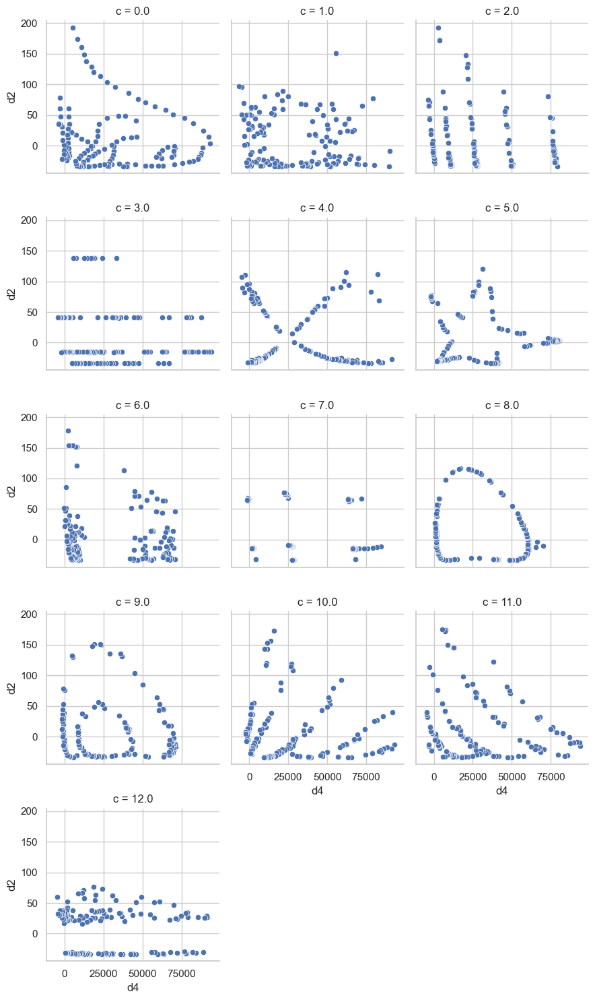

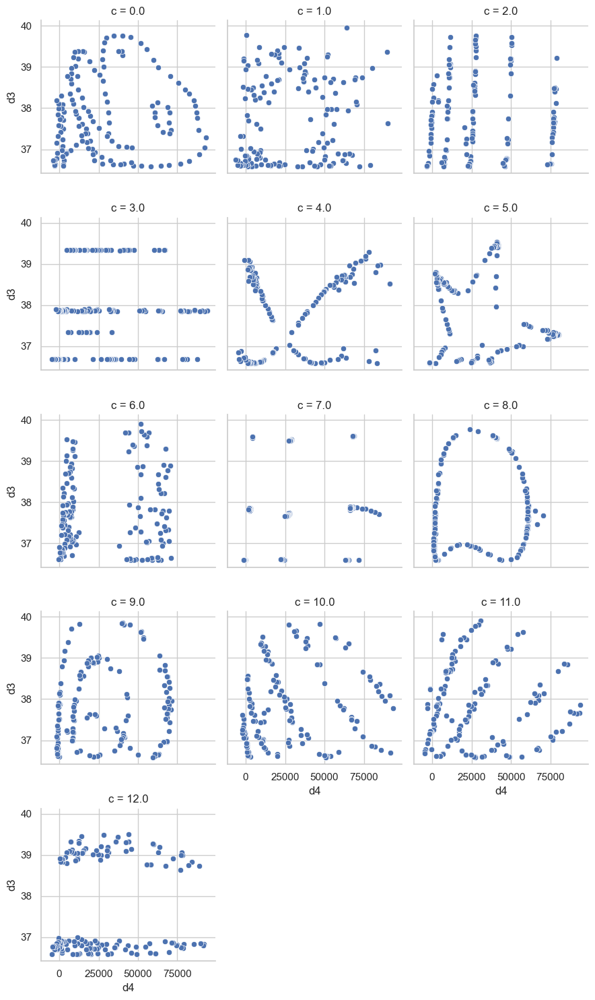

In [133]:
y_vars = ['x', 'y', 'z', 'd1', 'd2', 'd3']
for y_var in y_vars:
    g = sns.FacetGrid(df_mystery_sep2, col=col, col_wrap=3)
    g.map_dataframe(sns.scatterplot, x='d4', y=y_var)
    plt.show()

In cycling through, it looks like x and y create the pictures, and d1 through d4 are transforms of those pictures.  

The transform functions appear to emerge when cycling through different values on the x and y axes.

No picture or function appears to emerge with z.  It appears to just be noise. 